<a href="https://colab.research.google.com/github/SimplyDifficult/ML-for-Wireless/blob/main/12.Noisy2_20_dim_user_case_BOGP_p%3D30.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
P_max = 30 #in dBm

In [2]:
var = 20
number_of_cells = 4

In [ ]:
!sudo add-apt-repository ppa:octave/stable
!sudo apt update
!sudo apt install octave

In [ ]:
!wget https://www.dropbox.com/s/llve9s3hfamwyni/function_uncorrelated_rayleigh_fading_channel_model.m
!wget https://www.dropbox.com/s/d1ytzzfpxsrpbcv/main_bitchanged.m -O /content/main.m
!wget https://www.dropbox.com/s/v3y2xe56qodthnm/function_SE.m
!wget https://www.dropbox.com/s/5p0j4qdqist7ibm/main_individual_transmit_case_for_Test_phase_bitchanged.m -O /content/main_individual_transmit_case_for_Test_phase.m

In [4]:
from numpy import arange
from numpy import vstack
from numpy import argmax
from numpy import asarray
from numpy.random import normal
from scipy.stats import norm
from sklearn.gaussian_process import GaussianProcessRegressor
from warnings import catch_warnings
from warnings import simplefilter
from matplotlib import pyplot
from scipy.optimize import minimize
import numpy as np
from scipy.io import loadmat, savemat
import numpy as np
from google.colab import files
import cv2
from scipy.optimize import dual_annealing

In [5]:
import warnings
warnings.filterwarnings('ignore')

In [6]:
#### Objective function
import random
def objective(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W main.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [7]:
#surrogate or approximation for the objective function
def surrogate(model, X):
	#catch any warning generated when making a prediction
	with catch_warnings():
		#ignore generated warnings
		simplefilter("ignore")
		return model.predict(X, return_std=True)

In [8]:
def UCBobjective(Xsamples, X, model, beta):
  Xsamples = Xsamples[np.newaxis,:]
  mu, std = surrogate(model, Xsamples)
  mu = mu[:, 0]
  sigma = beta
  probs = mu + sigma * std
  return -probs[0]

In [9]:
#optimize the acquisition function
def opt_acquisition(X, y, model, iteration):
  #Do it 5 times
  r_min, r_max = -31.0, P_max  
  bounds = []
  for ti in range(var):
    bounds = bounds + [[r_min, r_max]]
  min_result = 9999999999999.0
  min_answer = 0
  beta=0.2
  
  for i in range(5):
    result = dual_annealing(UCBobjective, bounds, args=(X,model,beta))
    if(result.fun<min_result):
      min_result = result.fun
      min_answer = result['x']    
  return min_answer

In [10]:
import random
def objective_FPA(tr_array):
  tr_in_mW = np.power(10,tr_array/10.0)
  savemat("transmit.mat", {"transmit":(tr_in_mW)})
  !octave -W /content/main_individual_transmit_case_for_Test_phase.m
  SE = loadmat('SE.mat')
  return np.sum(SE["SE"])

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
X = np.load("/content/drive/MyDrive/trainingx_BOGP_noisy_3.npy")
y = np.load("/content/drive/MyDrive/trainingy_BOGP_noisy_3.npy")
y_FPA = np.load("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_3.npy")

x_next is [ 13.69178126  -5.82495693  -1.48162772 -11.47833312   0.15563567
  20.10533651 -22.75328552  25.4395961   15.46925671 -29.35968123
   5.71602041  24.17757644   6.19071315 -21.08677678  14.51150969
  -7.41203758  -9.05444854 -20.2255003   -3.9932721  -14.9393535 ]
f()=0.000000, actual=22.114
0


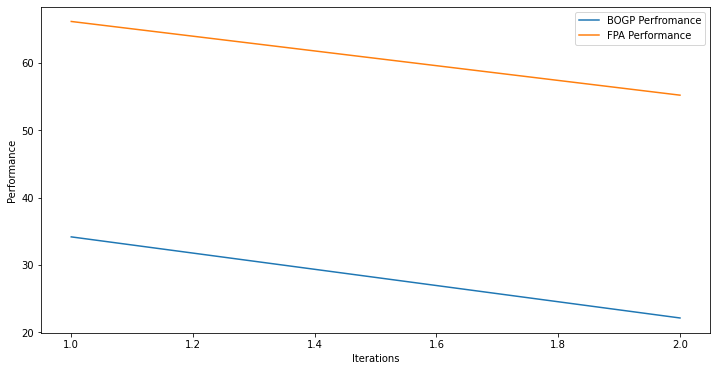

x_next is [ -8.05376431  16.37153602   9.50265078 -30.50710954  21.09598546
 -23.92922367  28.82389206  -9.34071145 -22.60709217  26.68311287
   0.66067171  16.97238685  18.21693528 -21.60225926 -10.40681653
  -2.43082012  -2.95081    -16.1041935   15.23055942   6.53391302]
f()=26.846832, actual=27.905
1


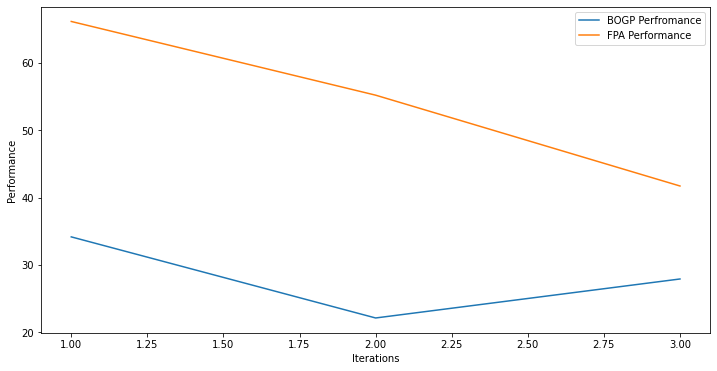

x_next is [-30.96251417  29.96334868  27.2379411   29.96592546  -7.12796486
 -30.9873902   29.97098572 -30.97936254 -30.99381147  29.95864287
 -30.97064105 -30.99422376 -30.96710918  29.98031839 -30.98621308
  29.99917204  29.84892183  29.98781014  29.98436423  29.99040686]
f()=27.627770, actual=40.978
2


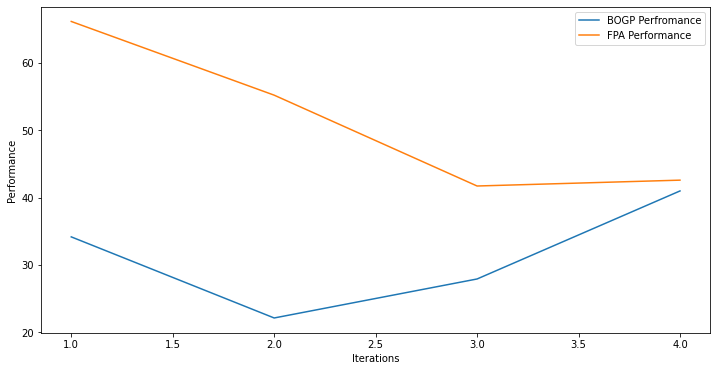

x_next is [ 27.4664892   -3.01658922  19.63229106  15.29386123  -4.66597648
   5.71420011  10.914978   -24.81906864 -18.99159392  25.06544092
  13.71226621 -15.59342311 -26.72484794 -30.28814745 -23.21077619
 -22.35598928 -29.66239248 -26.12478806 -25.01213138   2.47368214]
f()=30.761949, actual=30.881
3


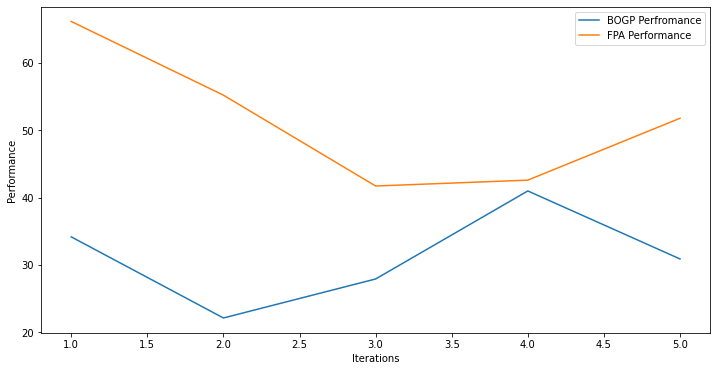

x_next is [-30.99998986  29.99999154  29.99978117  29.9998999  -30.99971332
 -30.99989475  29.9999419  -30.99997641 -30.99978046  29.99994066
 -30.99998362 -30.99999043 -30.999887    29.9999725  -30.99993476
  29.99978381  29.99997953  29.99996458  29.99998205  29.99999925]
f()=30.890171, actual=31.704
4


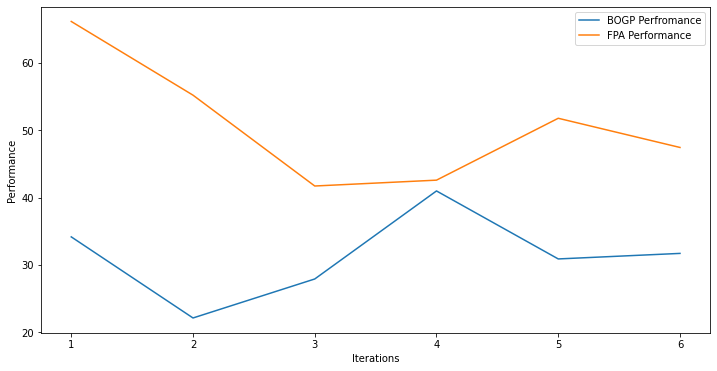

x_next is [-31.          30.          30.          30.          11.81930918
 -31.          30.         -31.         -31.          30.
 -31.         -31.         -31.          30.         -31.
  30.          30.          30.          30.          30.        ]
f()=34.641897, actual=30.709
5


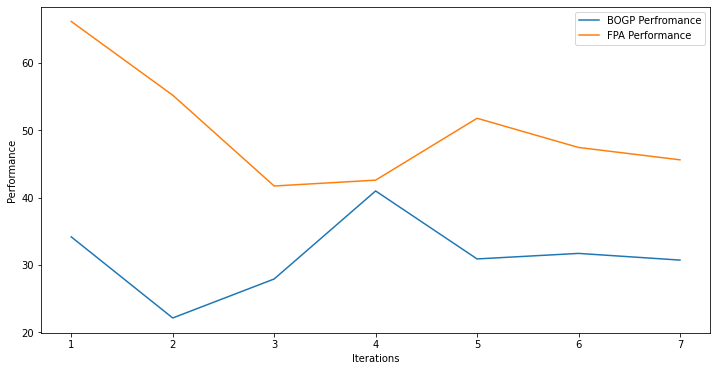

x_next is [ -6.32651838  -4.3365252   -0.19783504 -11.61457786 -19.90815542
  16.51518217 -13.62771807  -3.01844484   2.4213482  -20.96579105
  26.47947378  29.66918668  22.23381796  15.60822955  29.26831733
 -11.31259757  17.77322617 -22.05309927  18.32102468  24.17183855]
f()=31.055625, actual=35.487
6


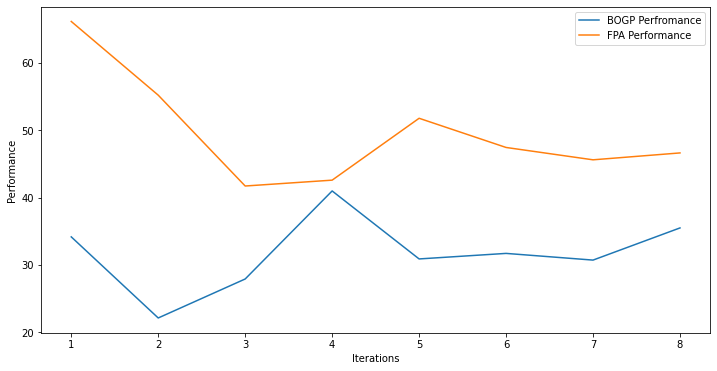

x_next is [-30.99999472  29.99996777  29.99964842  29.99987495 -30.99981736
 -30.99996082  29.9999831  -30.99983035 -30.99992578  29.99987648
 -30.99991534 -30.99995484 -30.99968976  29.99999201 -30.99984837
  29.99996039  29.99993056  29.99991533  29.99985417  29.99996551]
f()=31.621316, actual=37.891
7


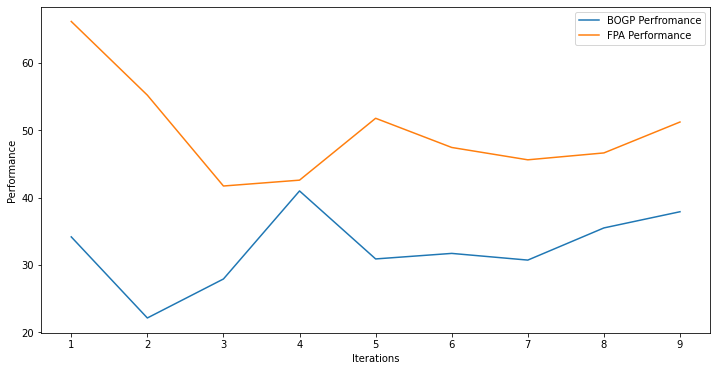

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.308558, actual=35.338
8


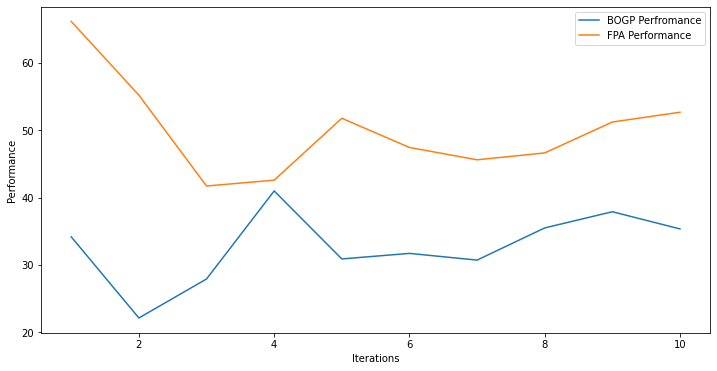

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.715740, actual=36.009
9


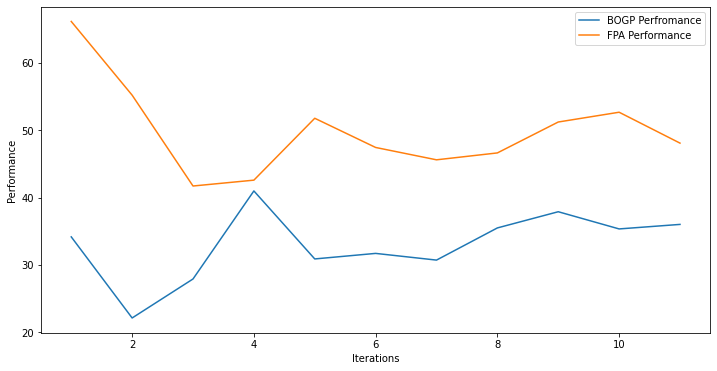

x_next is [-31.          30.          30.          30.         -31.
 -31.          30.         -31.         -31.          30.
 -16.66009471 -31.         -31.          30.         -31.
  30.          30.          30.          30.          30.        ]
f()=35.091354, actual=34.103
10


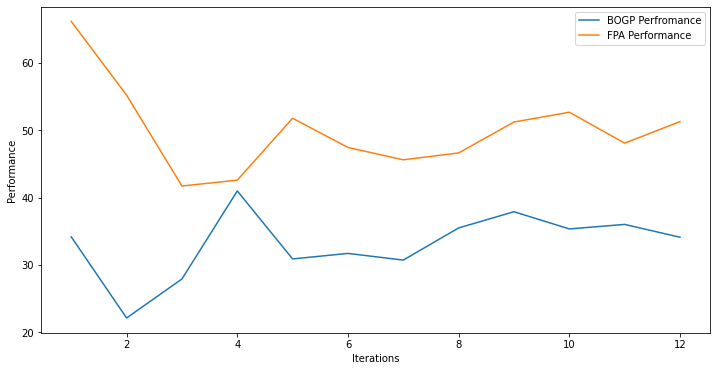

x_next is [-31.          30.          30.          30.         -31.
 -31.          30.         -31.         -31.          30.
 -27.63462099 -31.         -31.          30.         -31.
  30.          30.          30.          30.          30.        ]
f()=35.000026, actual=36.065
11


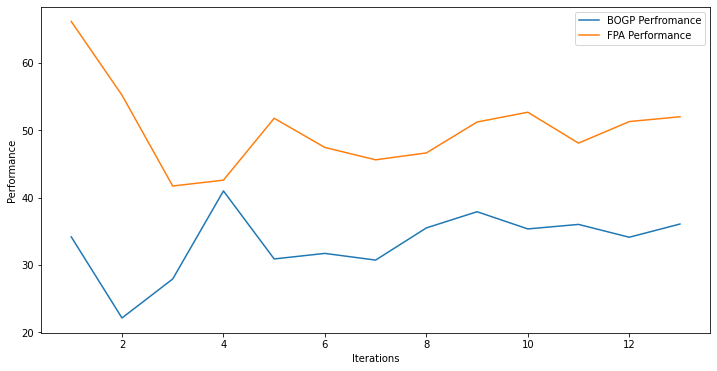

x_next is [-31.          30.          30.          30.         -31.
 -31.          30.         -31.         -31.          30.
  30.         -31.         -31.          30.          -1.06670544
  30.          30.          30.          30.          30.        ]
f()=35.190161, actual=30.720
12


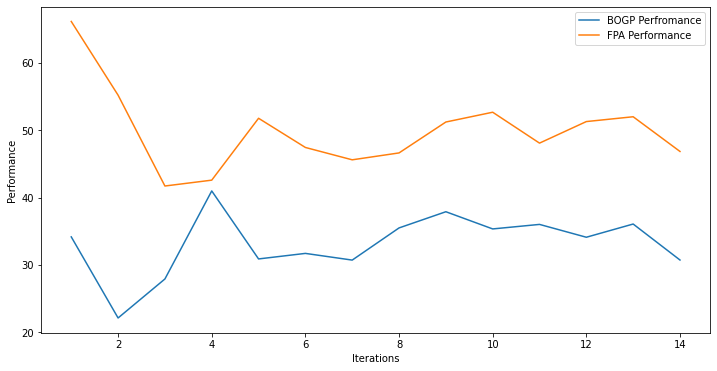

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.734960, actual=26.818
13


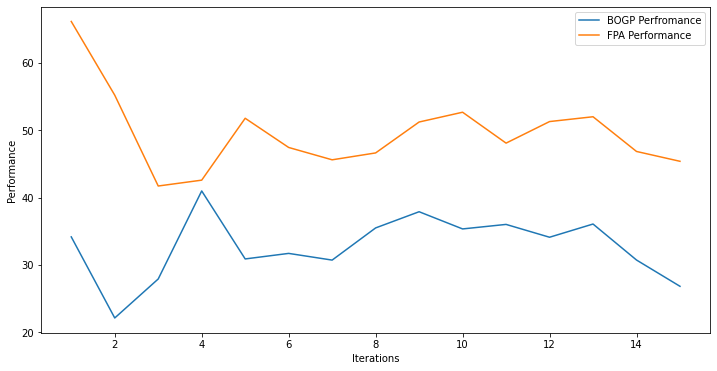

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=33.673023, actual=39.159
14


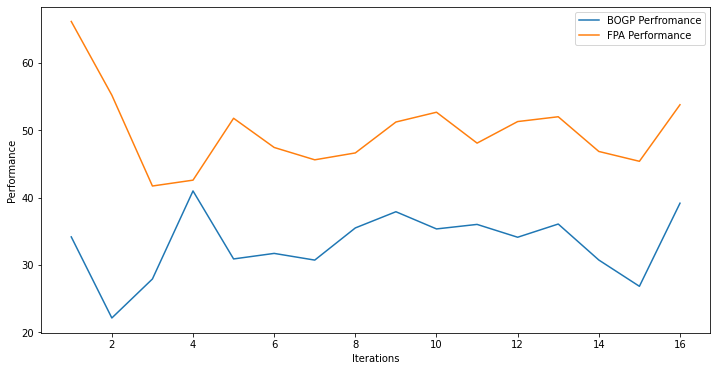

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.232431, actual=35.908
15


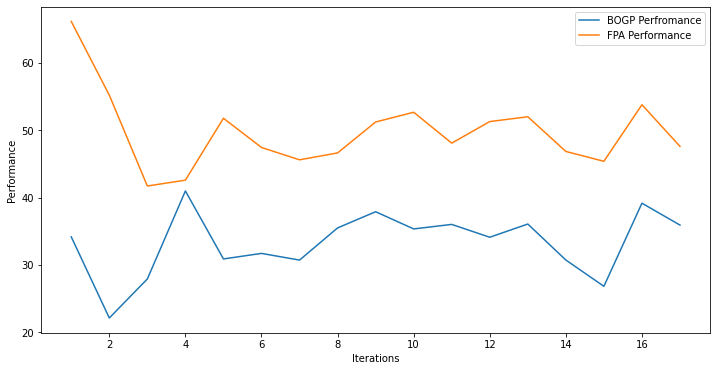

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.422826, actual=44.709
16


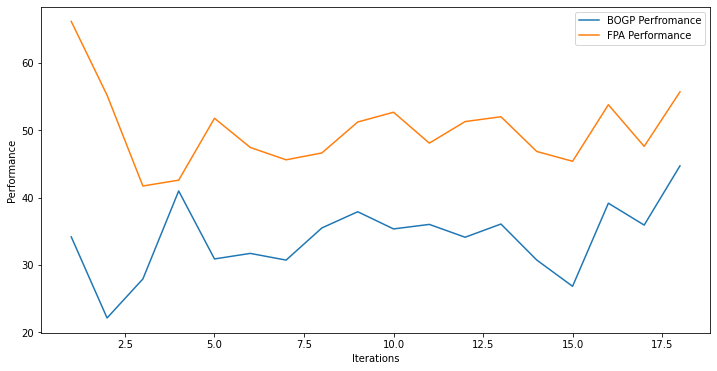

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.199376, actual=43.654
17


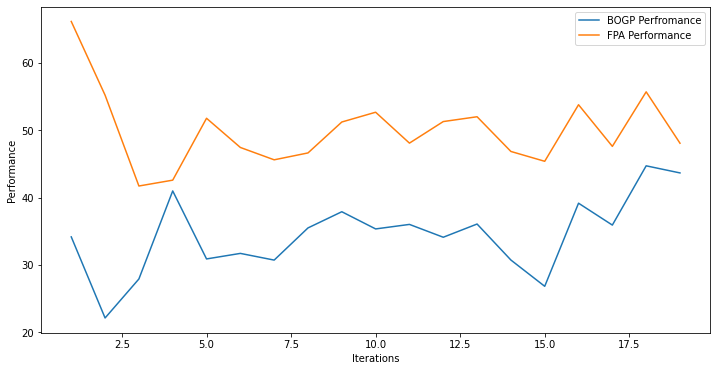

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.830597, actual=37.784
18


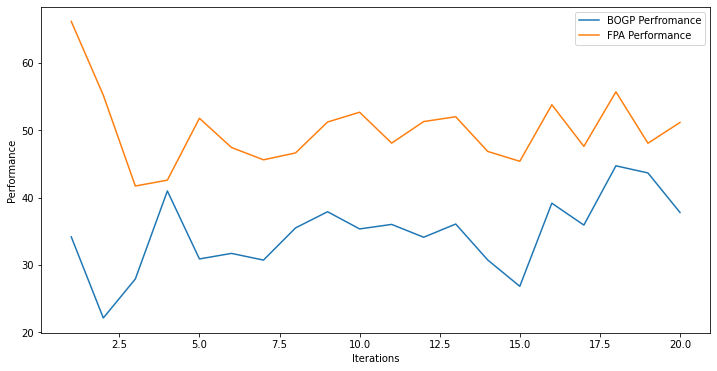

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=36.002538, actual=31.910
19


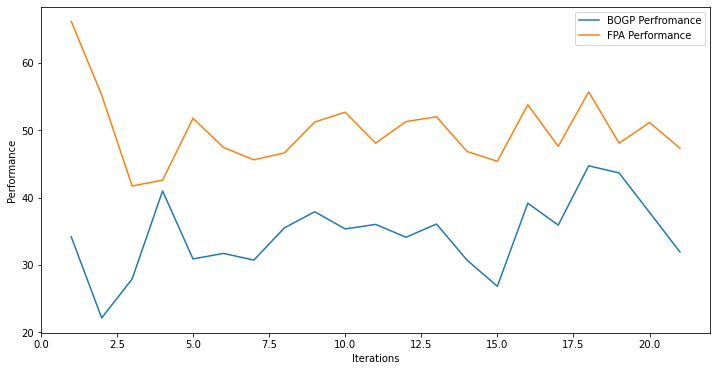

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.720824, actual=31.941
20


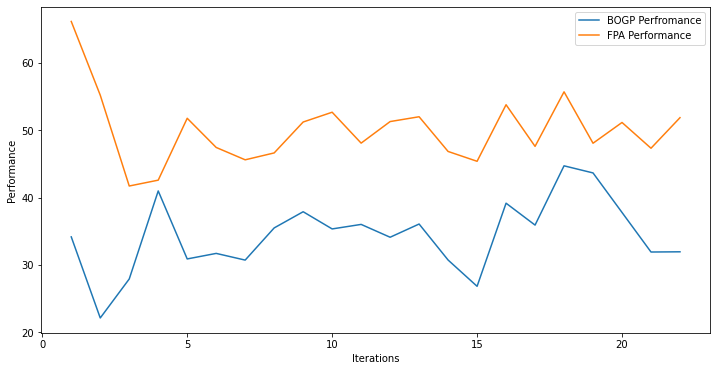

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.480792, actual=38.894
21


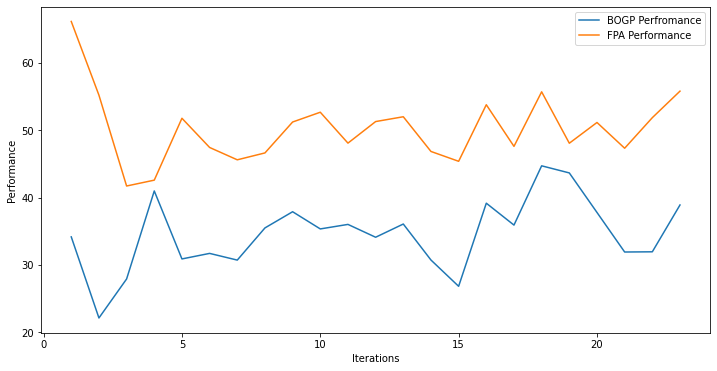

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.700280, actual=29.988
22


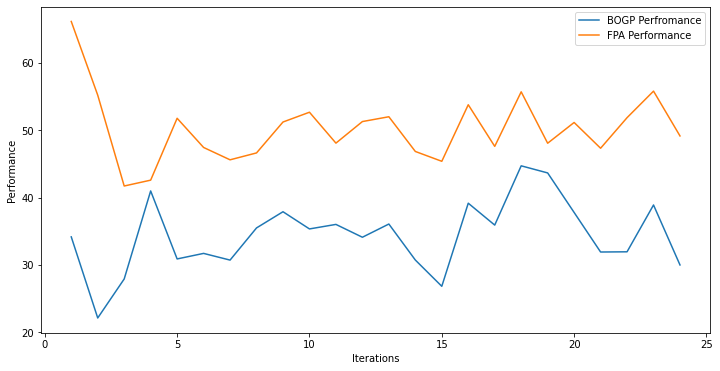

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.361960, actual=34.569
23


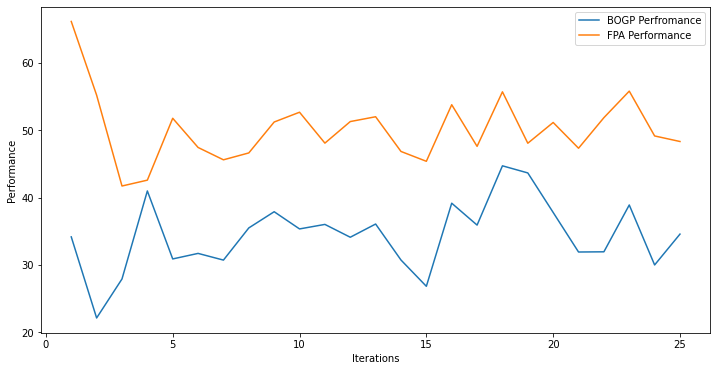

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.333107, actual=34.784
24


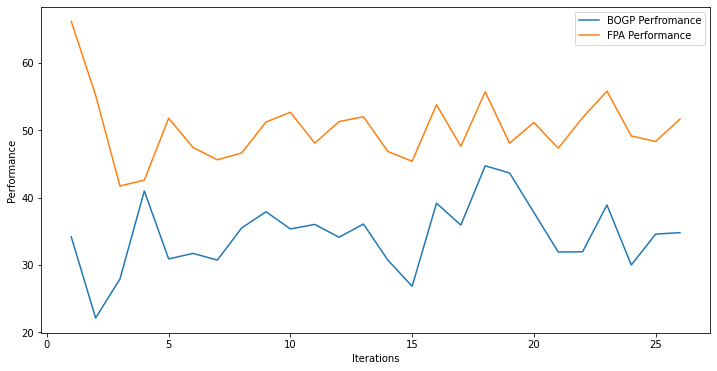

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.317823, actual=37.271
25


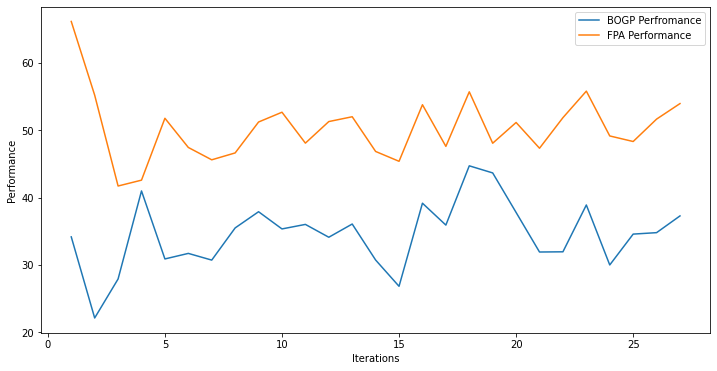

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.424095, actual=34.692
26


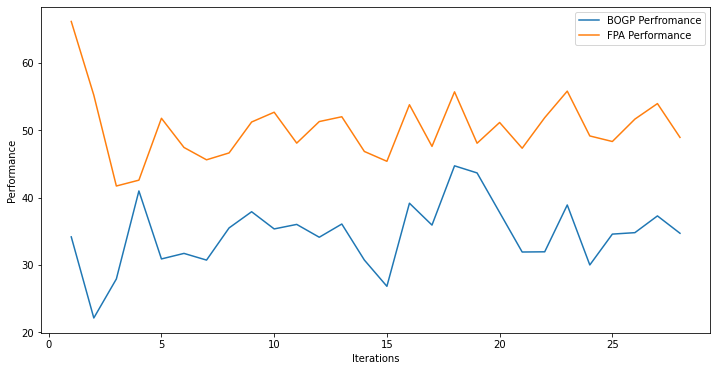

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.400372, actual=33.554
27


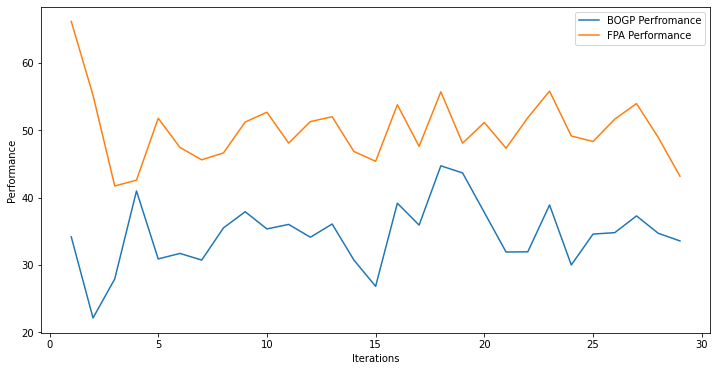

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.325660, actual=29.328
28


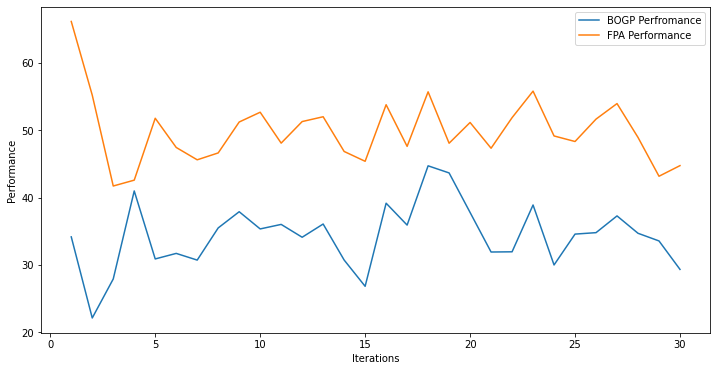

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.060478, actual=36.934
29


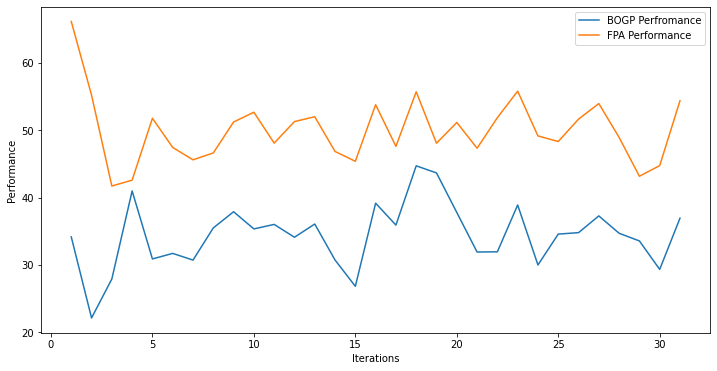

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.144417, actual=30.899
30


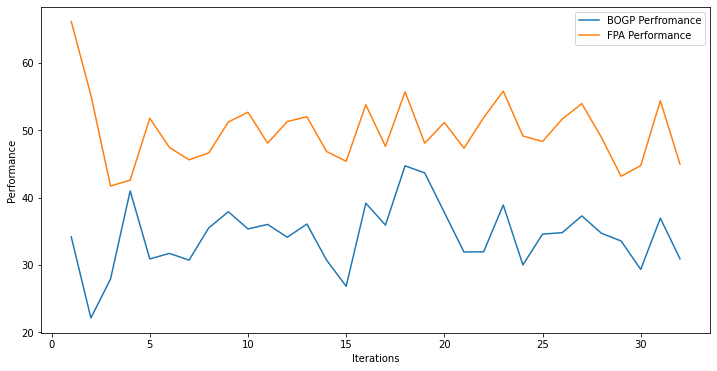

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.977271, actual=38.697
31


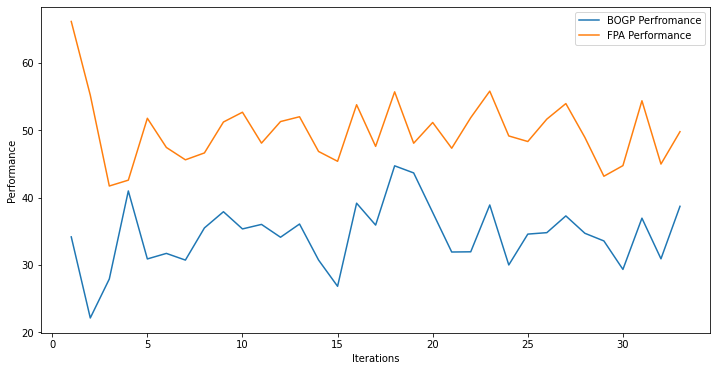

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.120505, actual=37.647
32


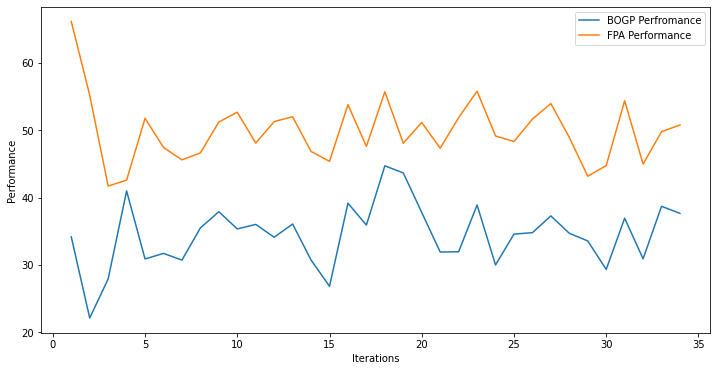

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.217475, actual=30.861
33


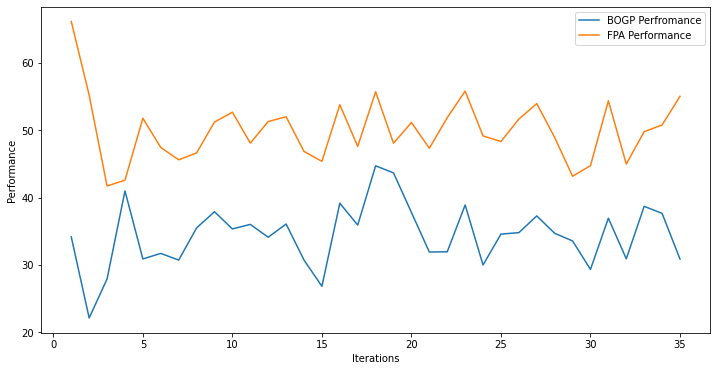

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.063442, actual=31.967
34


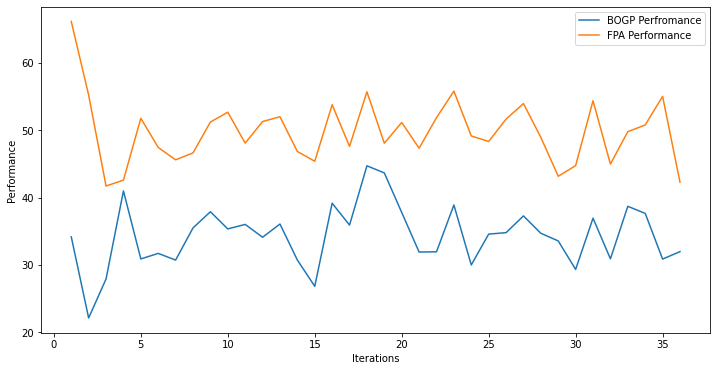

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.960720, actual=27.785
35


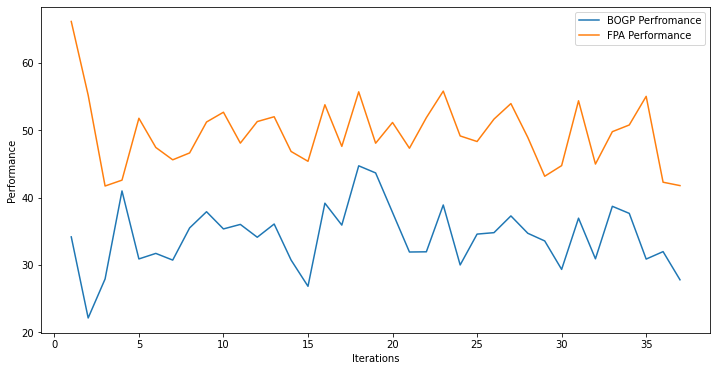

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.714922, actual=30.850
36


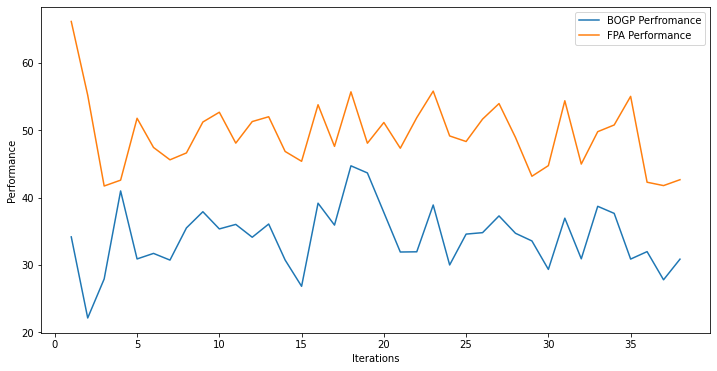

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.592998, actual=34.917
37


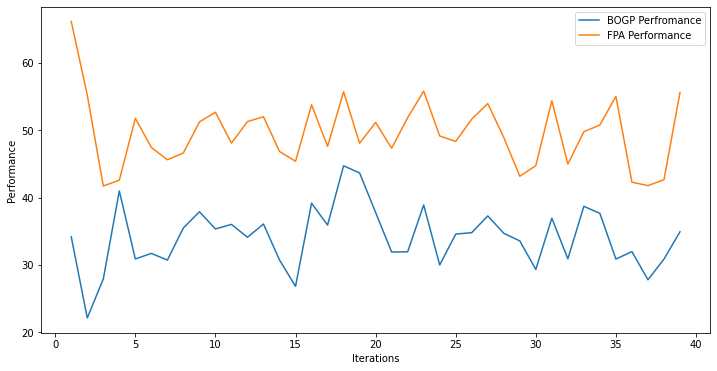

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.607830, actual=33.548
38


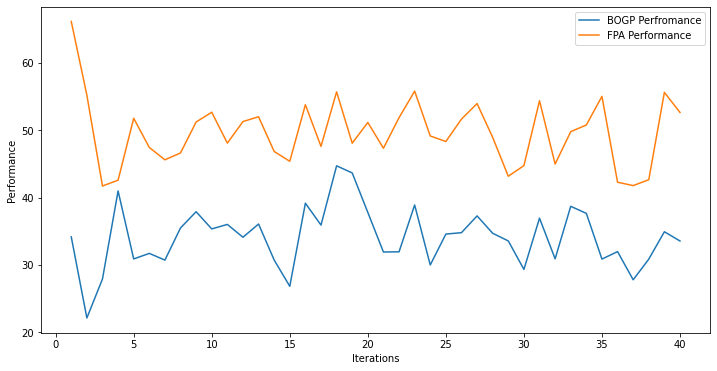

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.580387, actual=32.654
39


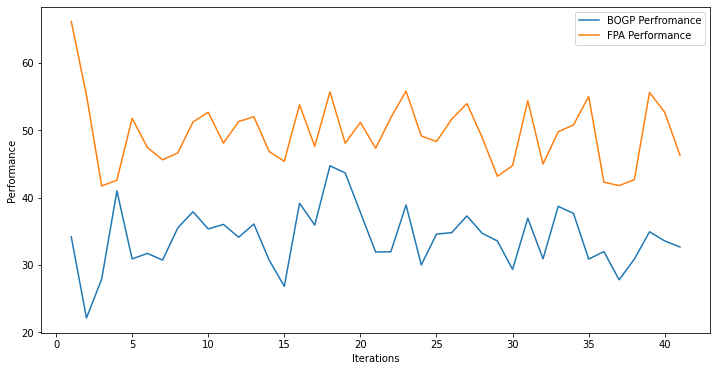

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.527792, actual=35.680
40


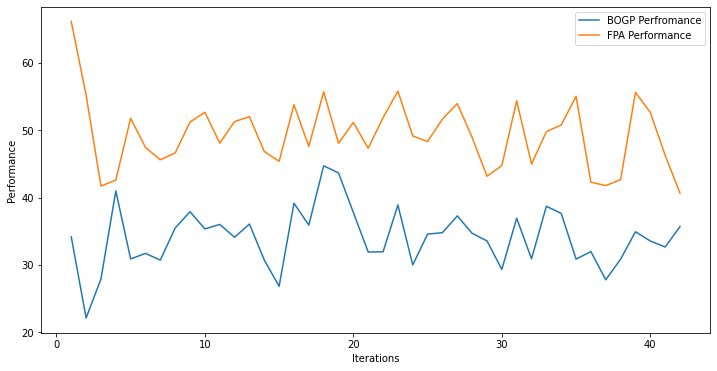

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.564019, actual=45.124
41


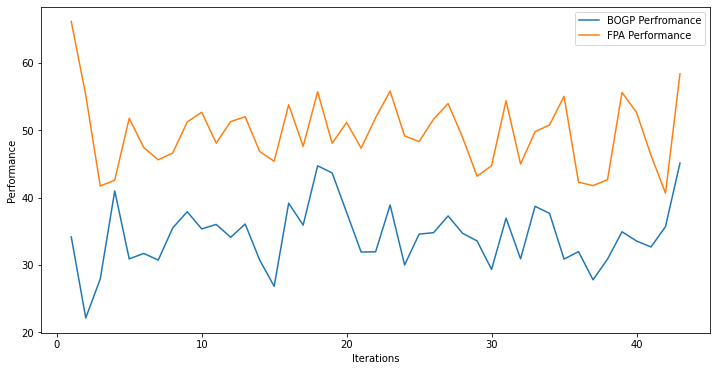

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.834395, actual=34.945
42


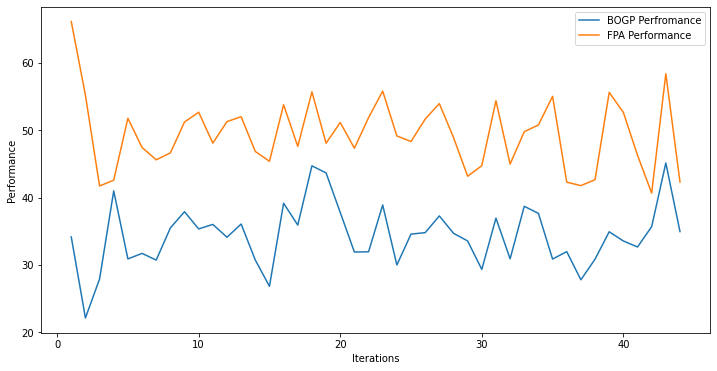

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.841139, actual=39.066
43


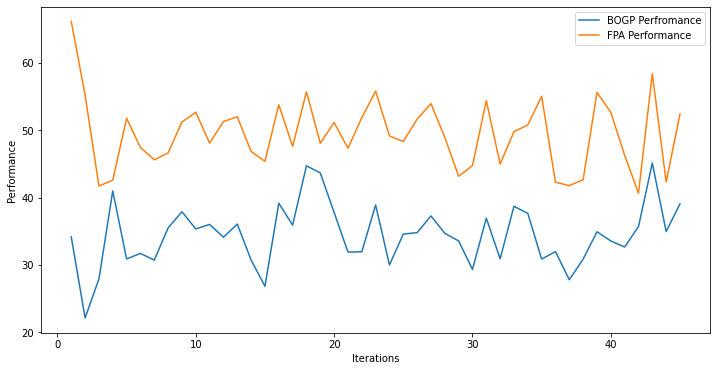

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.951441, actual=37.535
44


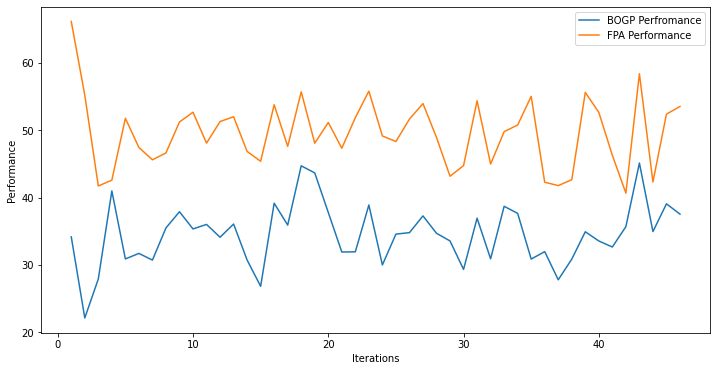

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.019267, actual=33.979
45


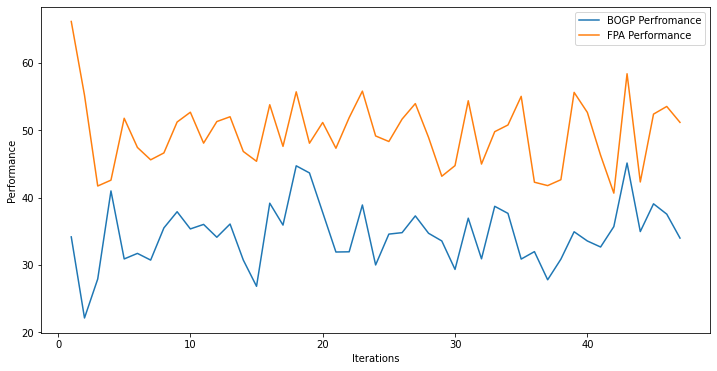

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.996546, actual=45.103
46


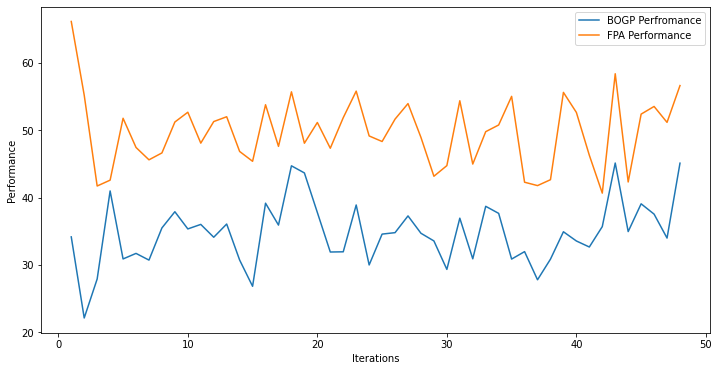

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.227346, actual=35.149
47


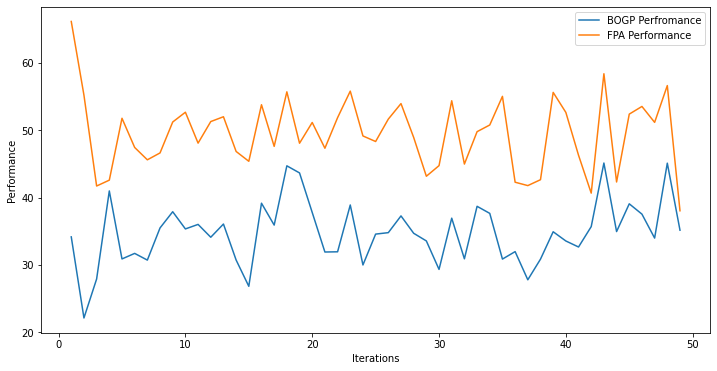

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.228568, actual=34.200
48


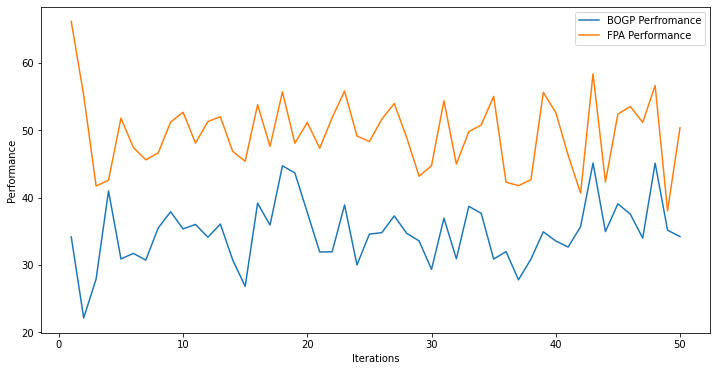

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.207581, actual=35.263
49


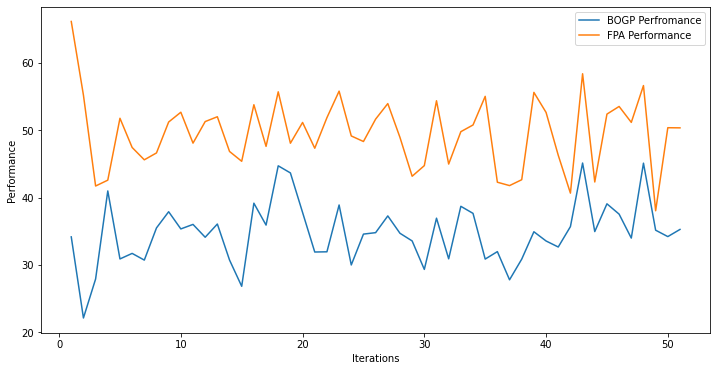

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.211580, actual=29.684
50


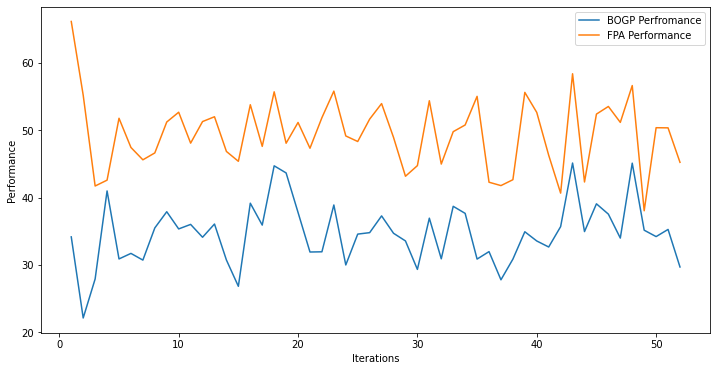

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.088082, actual=36.943
51


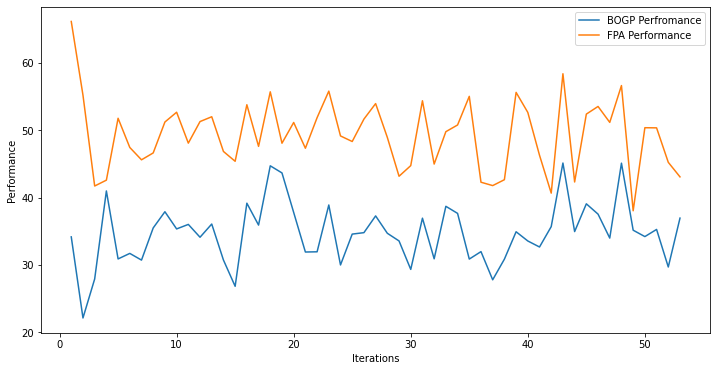

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.130174, actual=35.243
52


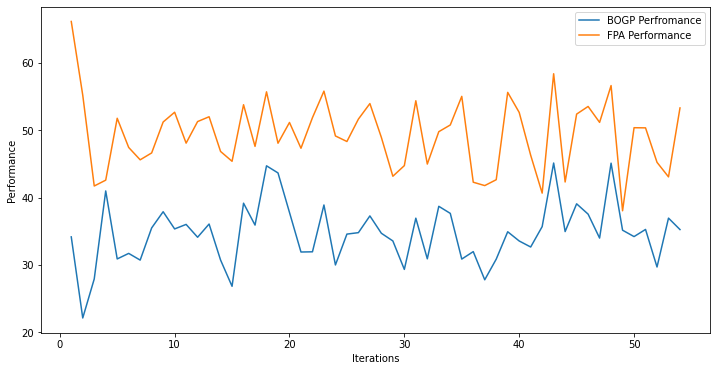

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.134958, actual=38.351
53


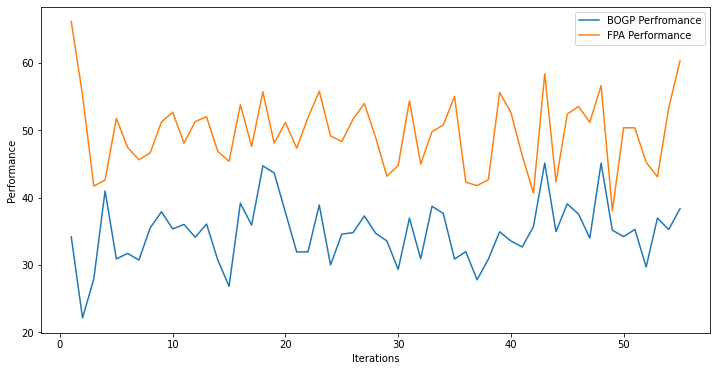

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.202495, actual=38.720
54


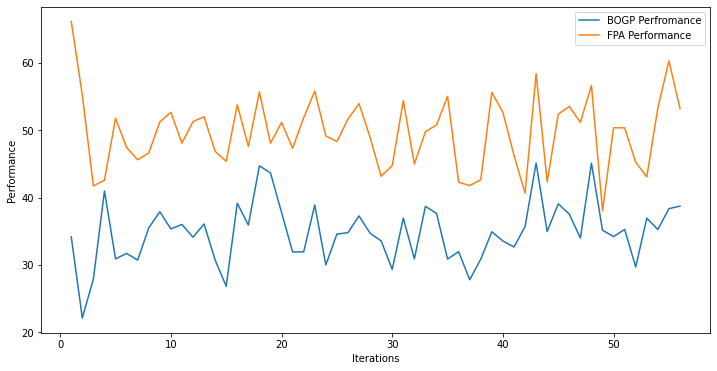

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.274532, actual=39.635
55


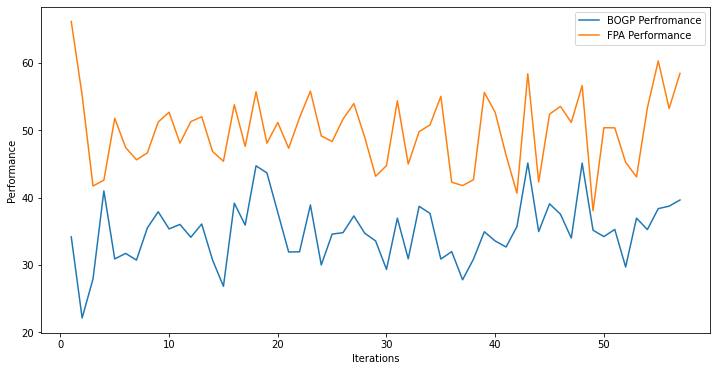

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.361131, actual=36.563
56


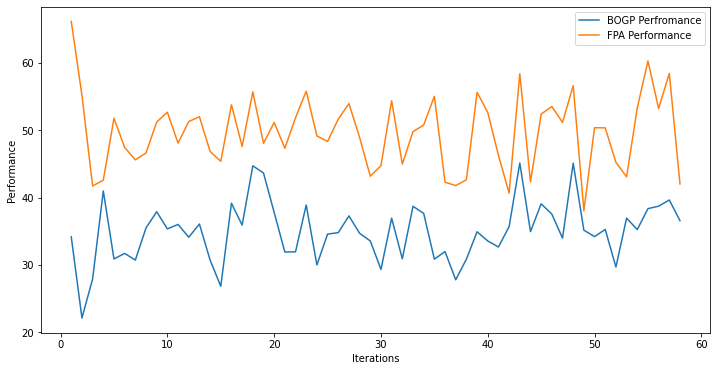

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.386467, actual=39.578
57


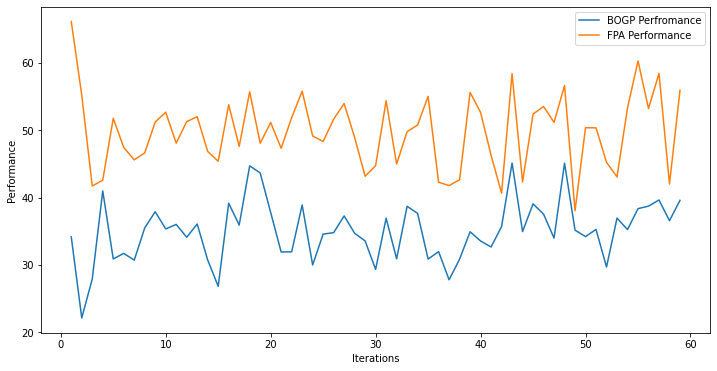

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.466702, actual=36.908
58


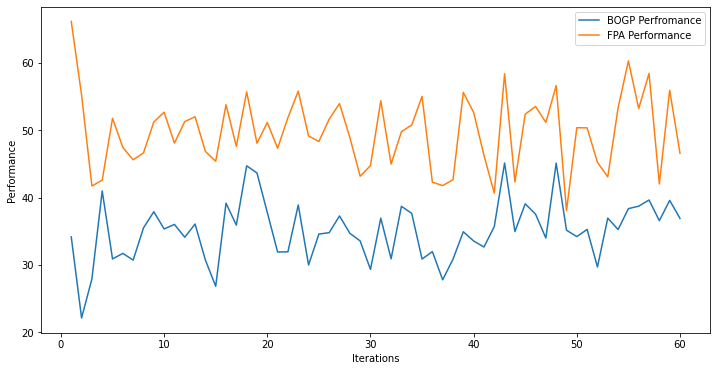

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.495463, actual=37.756
59


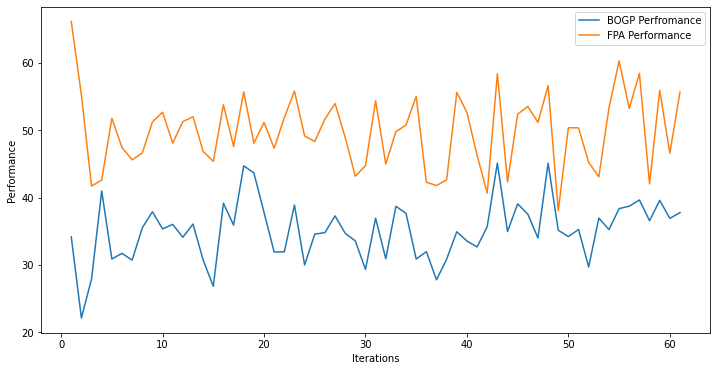

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.538475, actual=29.576
60


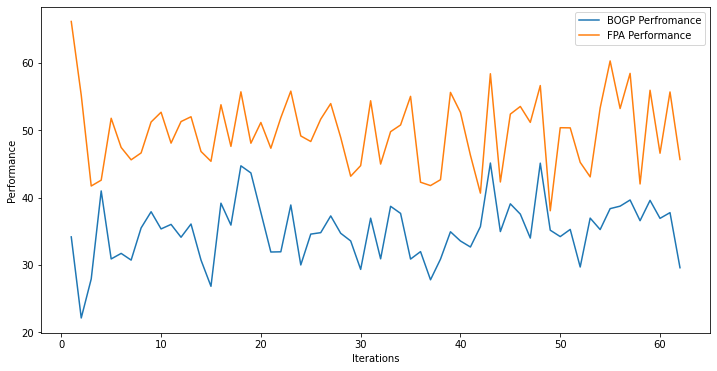

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.428676, actual=32.880
61


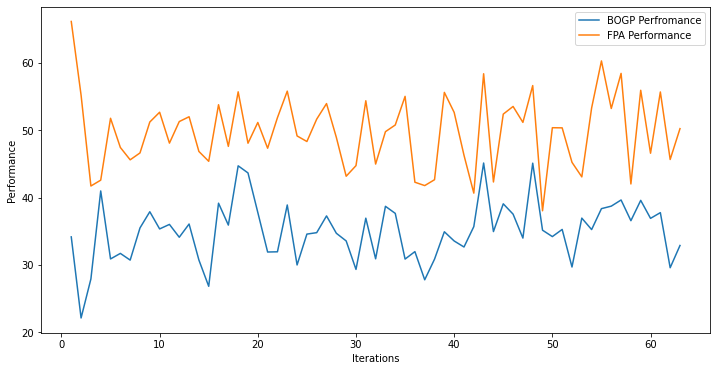

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.384460, actual=38.069
62


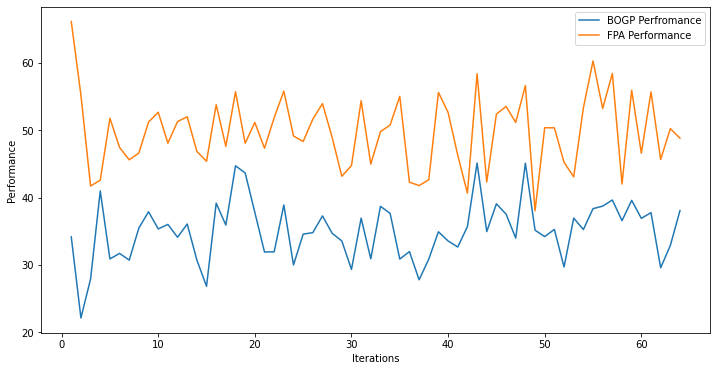

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.432311, actual=33.194
63


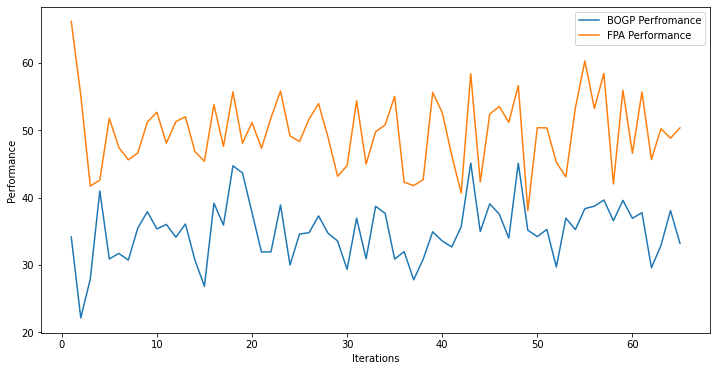

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.395033, actual=38.546
64


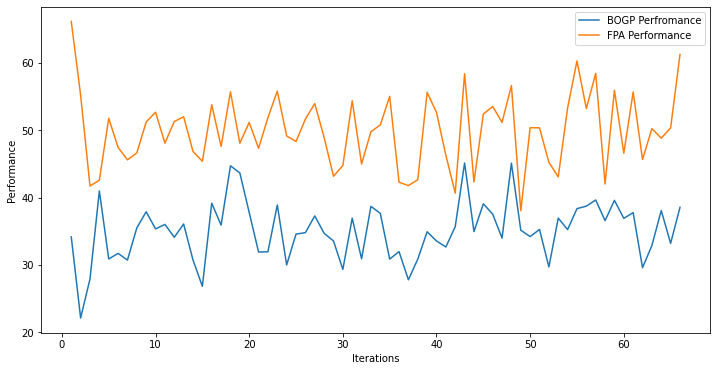

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.448856, actual=24.373
65


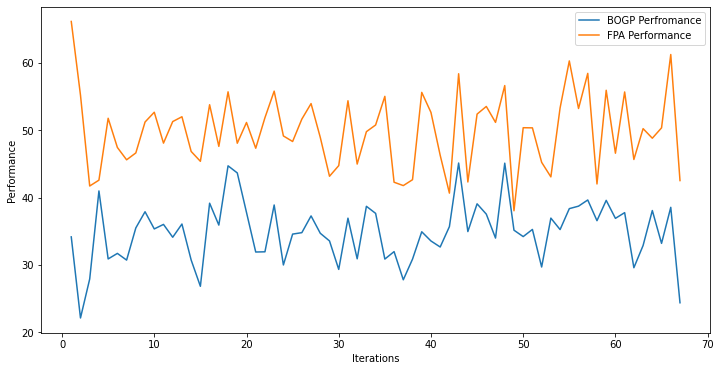

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.256215, actual=38.841
66


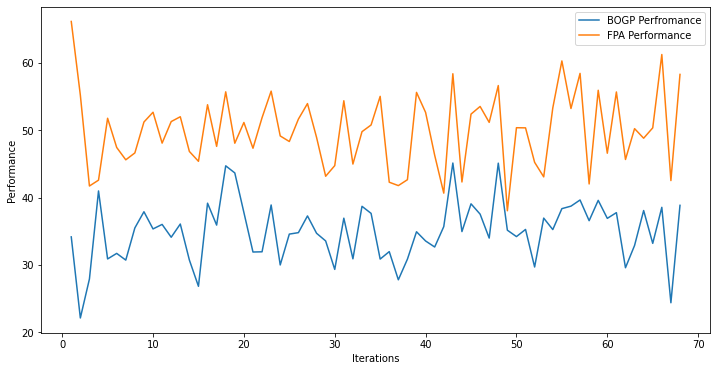

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.315131, actual=35.159
67


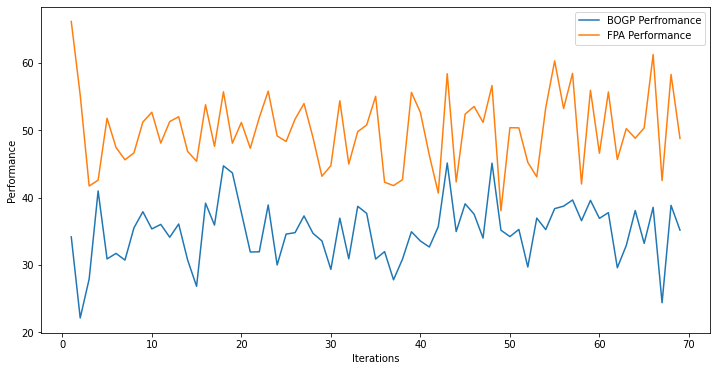

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.314060, actual=33.678
68


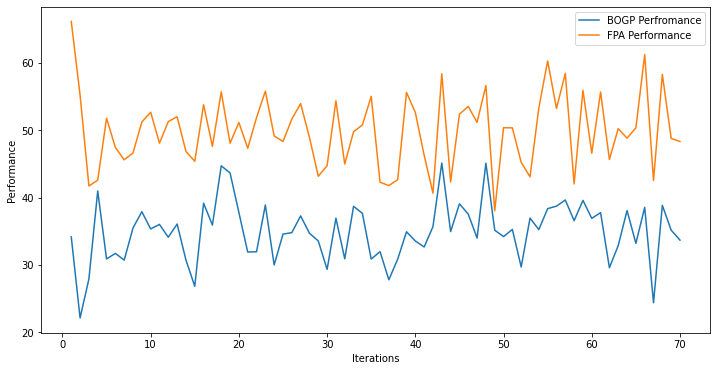

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.289398, actual=38.349
69


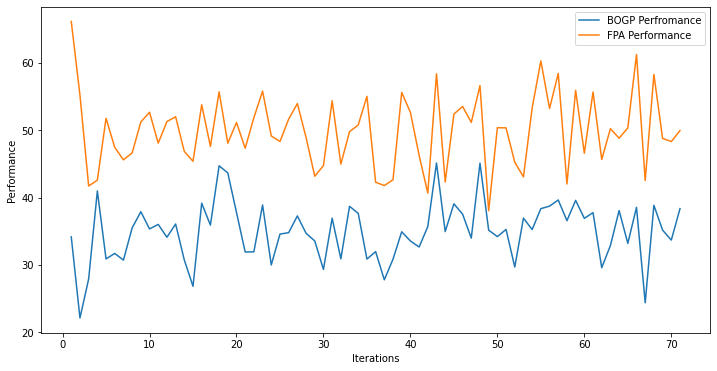

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.337605, actual=21.983
70


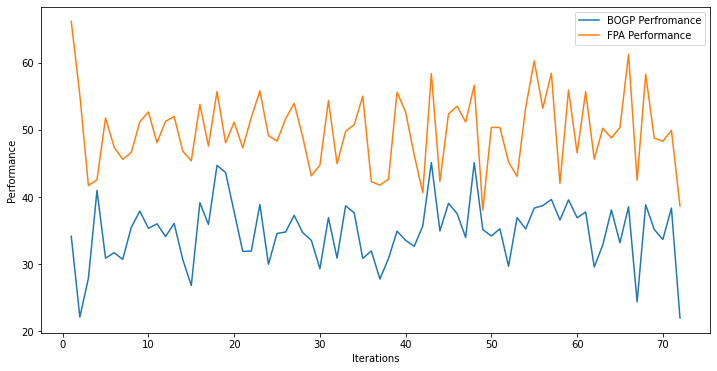

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.122165, actual=33.200
71


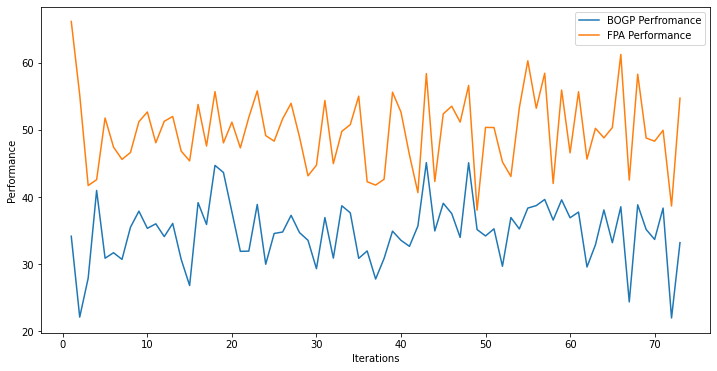

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.094264, actual=32.612
72


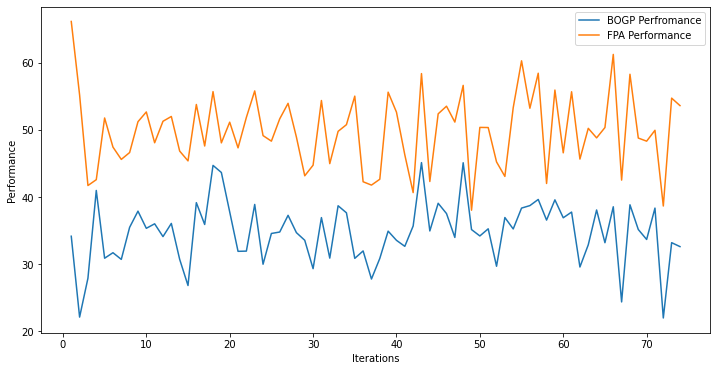

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.058283, actual=32.139
73


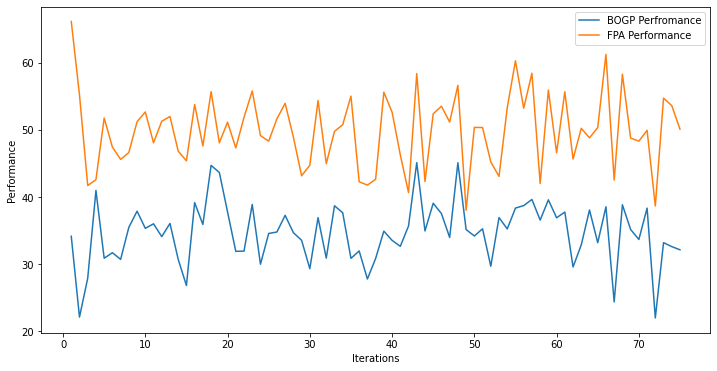

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.016278, actual=42.675
74


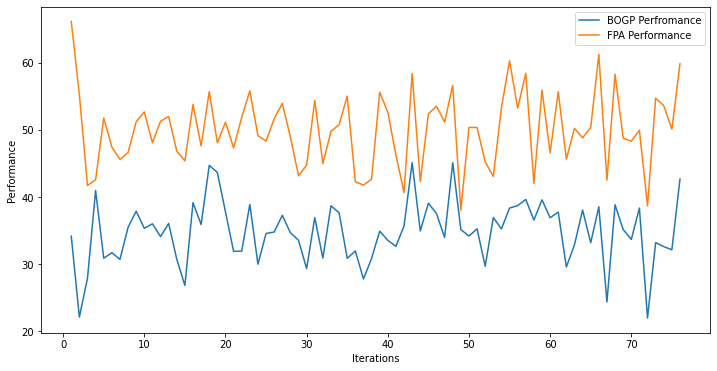

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.124335, actual=34.582
75


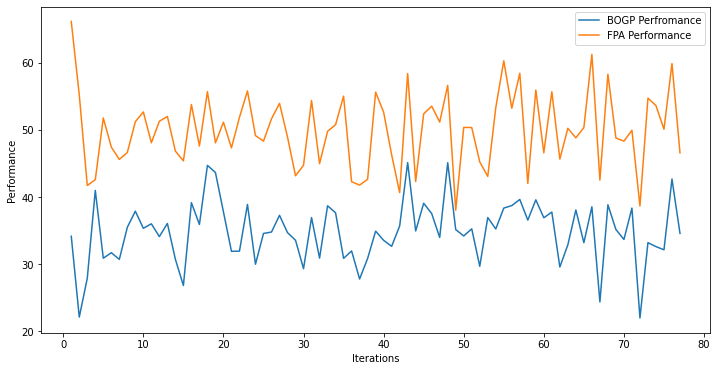

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.117765, actual=38.336
76


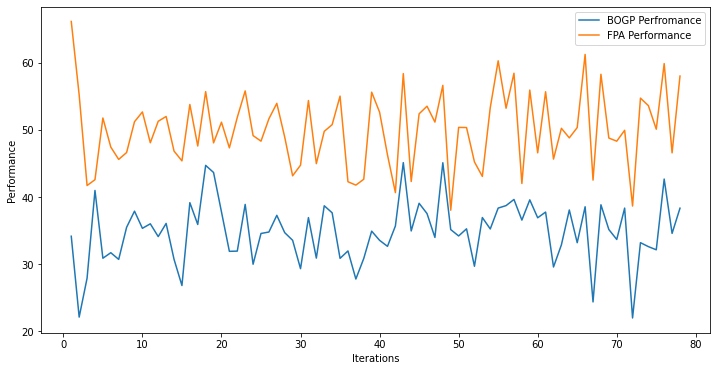

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.163383, actual=26.196
77


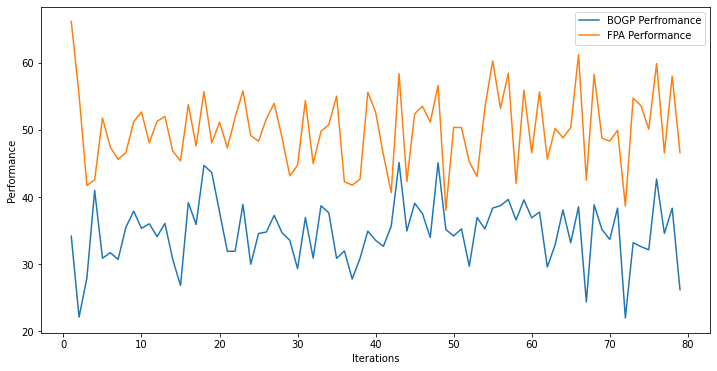

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.036188, actual=40.374
78


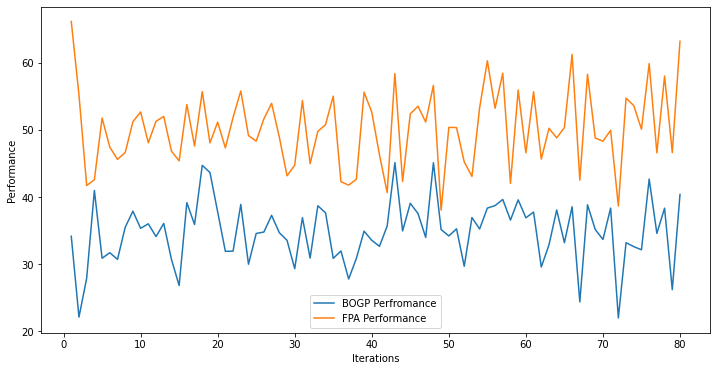

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.108497, actual=40.663
79


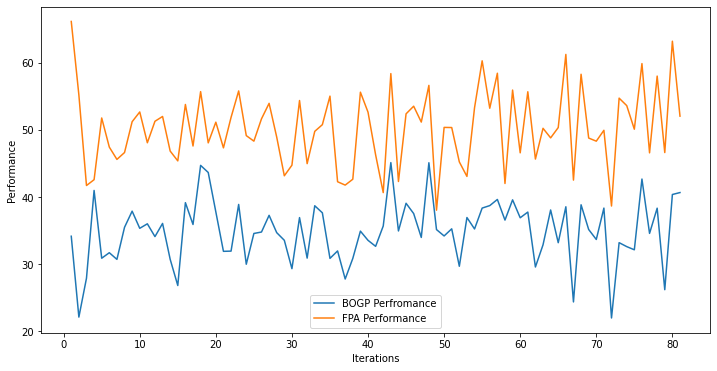

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.182650, actual=36.146
80


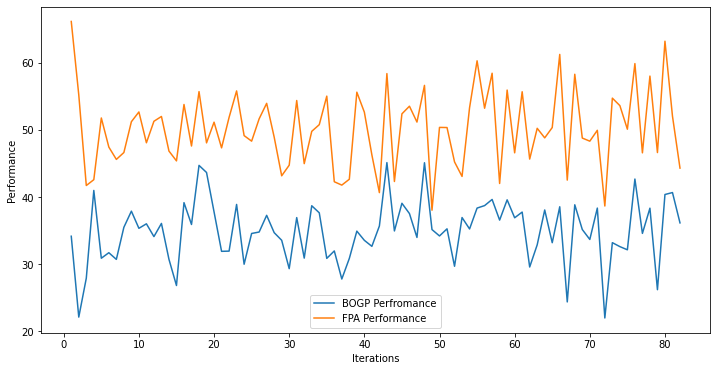

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.196416, actual=42.458
81


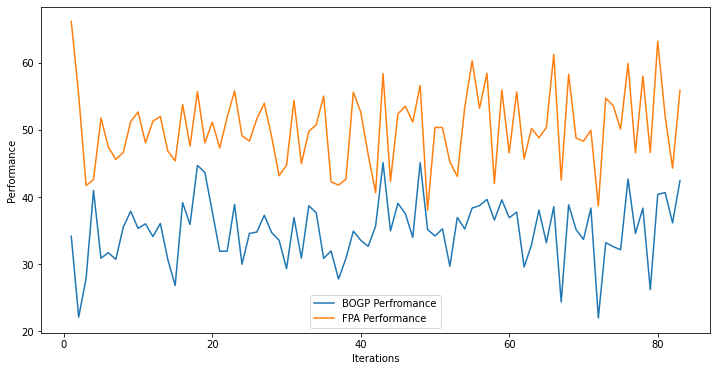

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.289936, actual=31.295
82


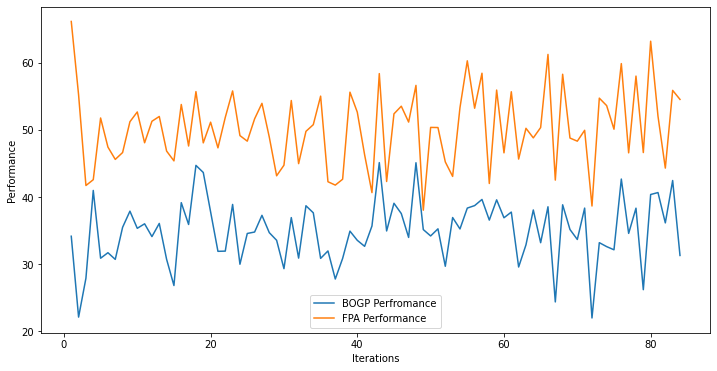

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.238559, actual=39.161
83


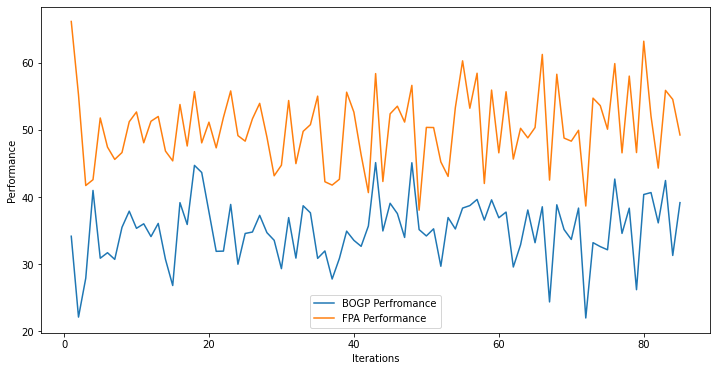

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.288825, actual=37.574
84


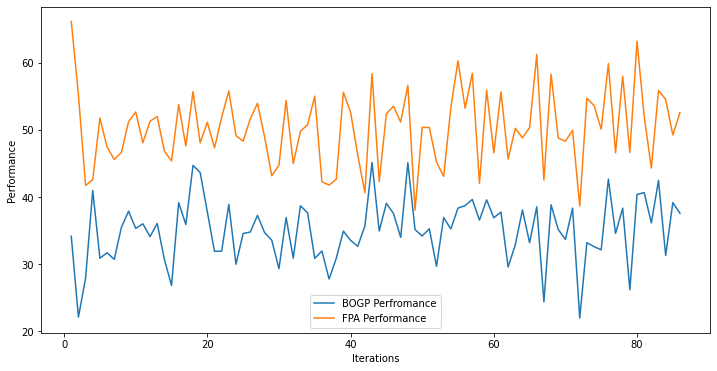

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.318340, actual=36.601
85


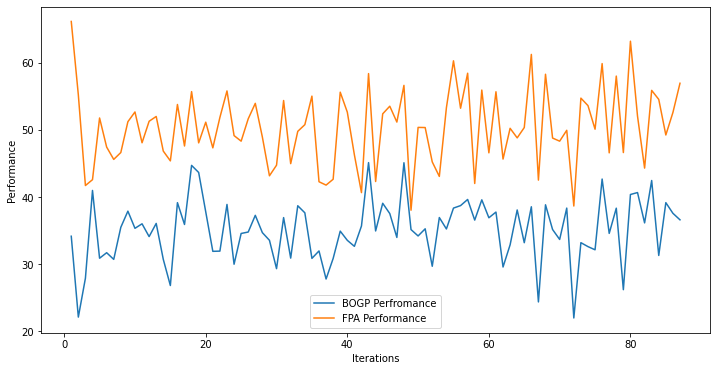

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.335127, actual=23.844
86


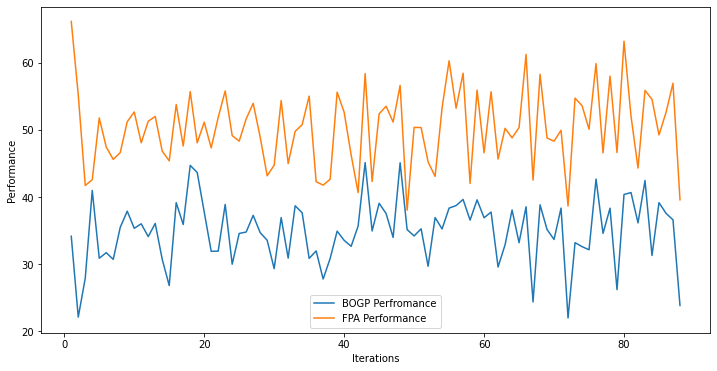

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.189118, actual=31.946
87


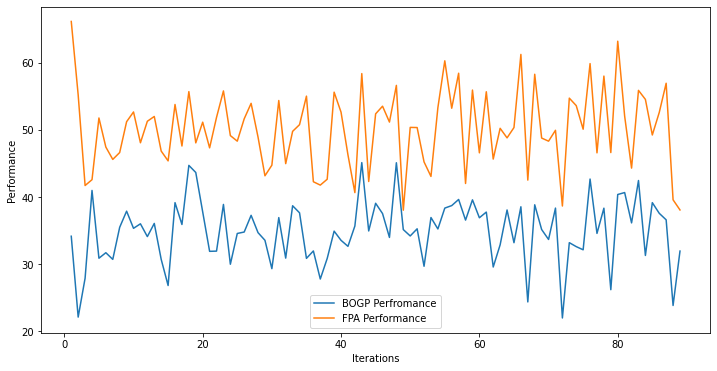

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.150204, actual=39.878
88


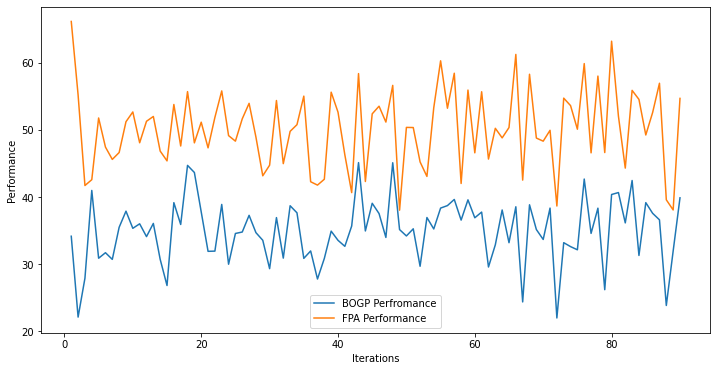

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.206872, actual=36.129
89


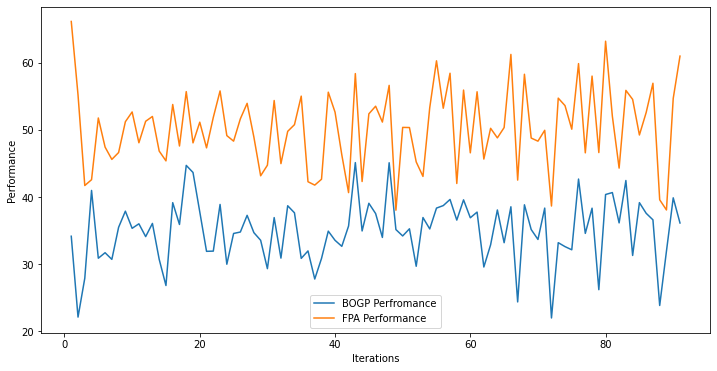

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.218618, actual=34.505
90


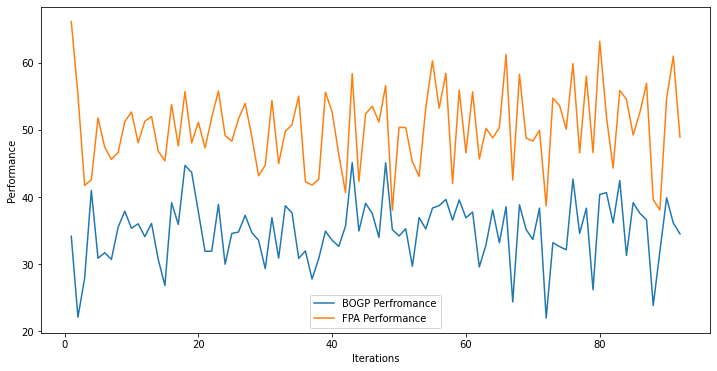

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.211054, actual=37.350
91


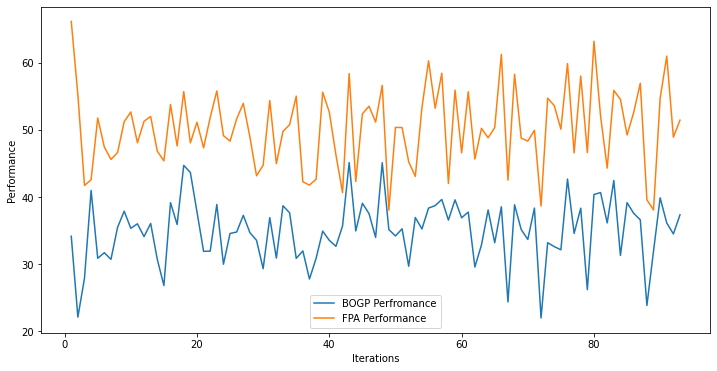

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.236446, actual=34.055
92


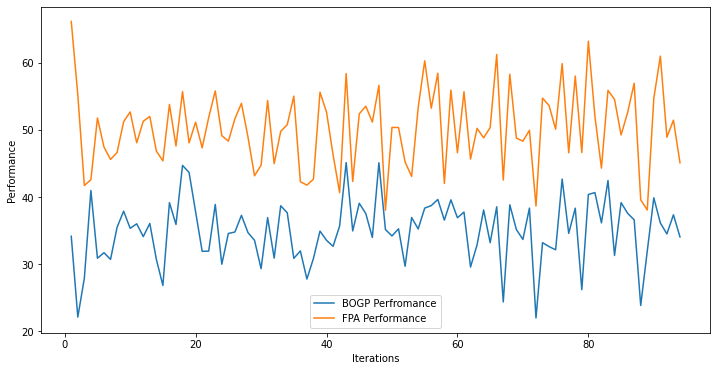

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.223641, actual=33.369
93


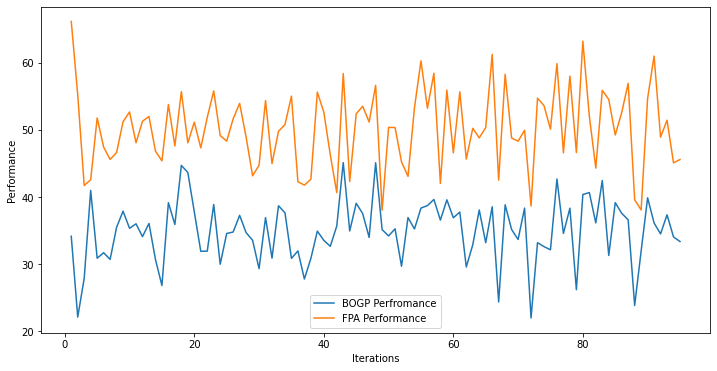

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.203286, actual=35.073
94


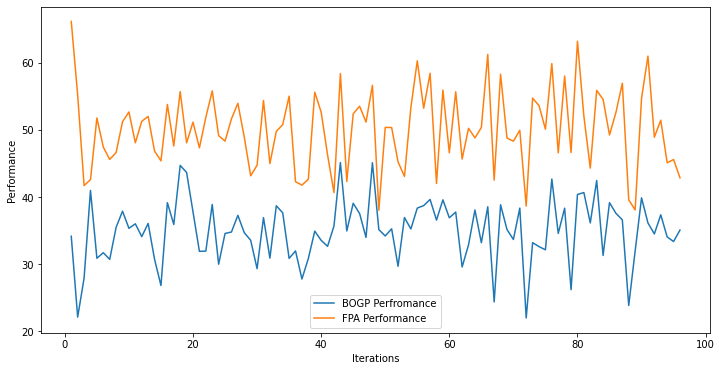

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.202567, actual=31.591
95


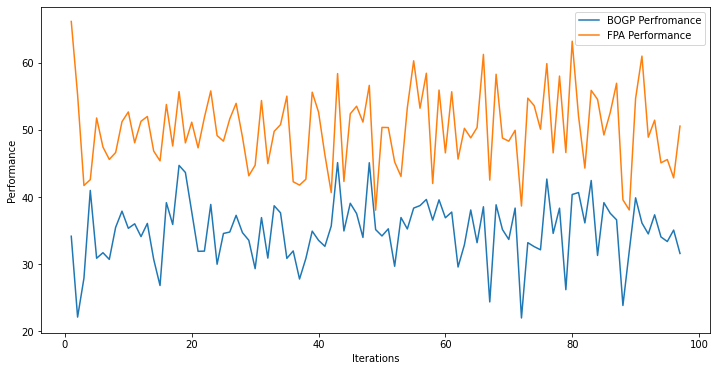

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.162865, actual=35.383
96


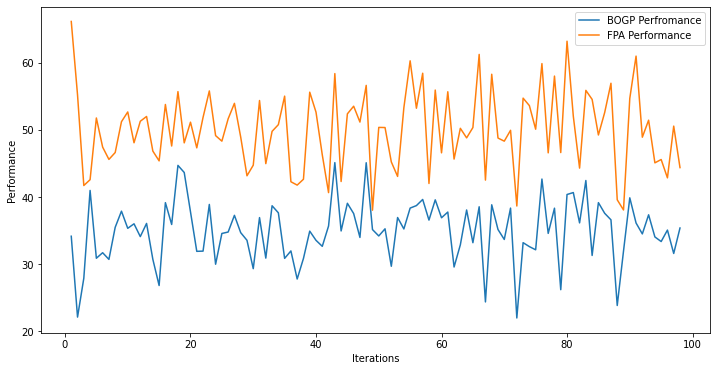

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.165984, actual=35.026
97


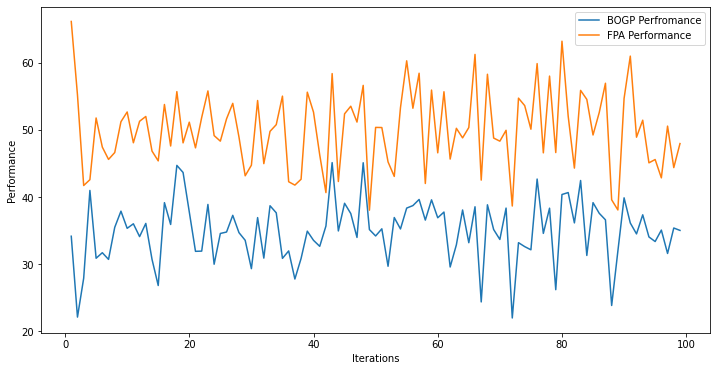

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.165138, actual=30.479
98


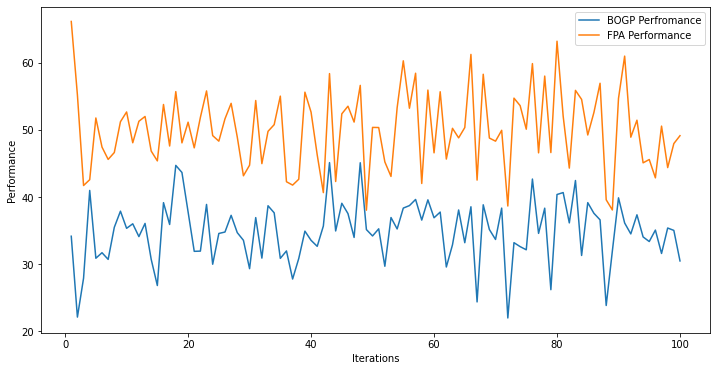

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.114873, actual=37.504
99


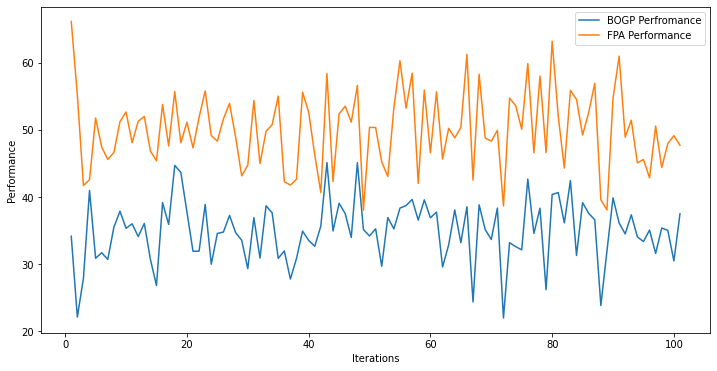

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.140654, actual=36.821
100


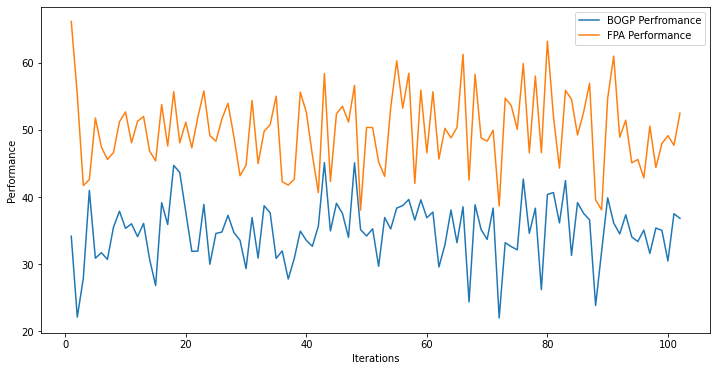

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.158816, actual=34.433
101


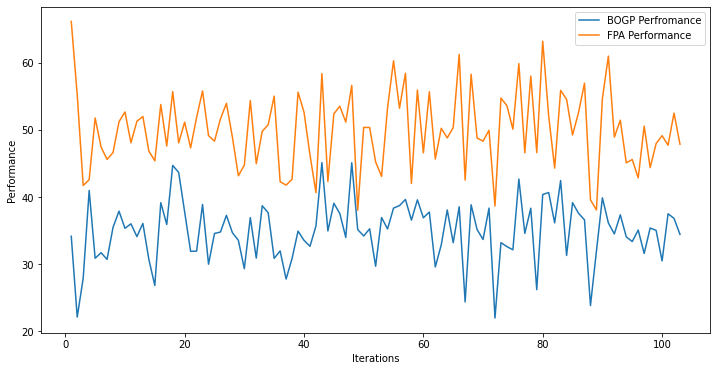

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.151891, actual=34.216
102


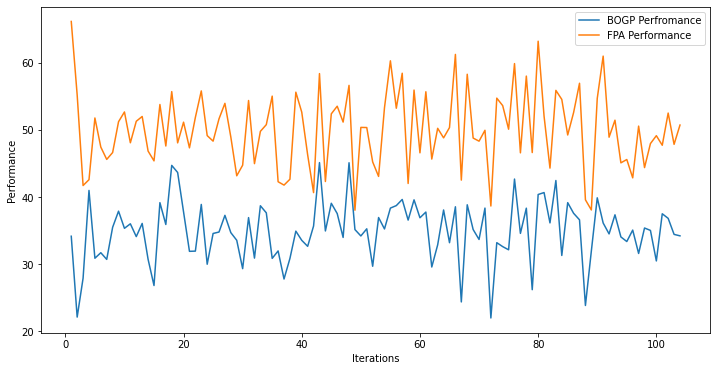

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.142863, actual=35.462
103


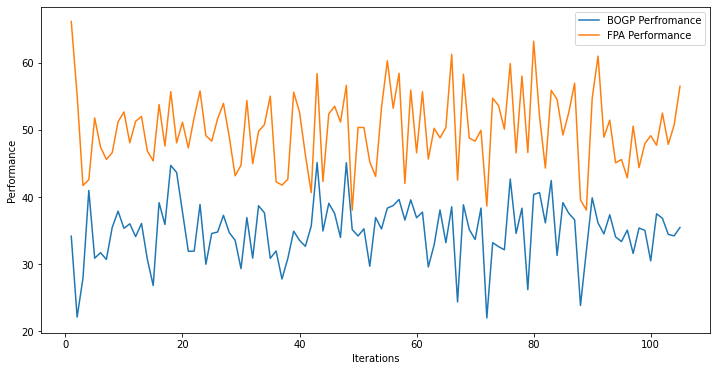

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.146697, actual=34.342
104


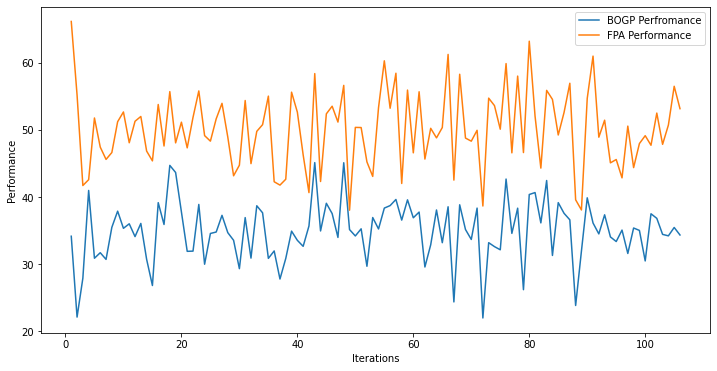

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.139161, actual=29.729
105


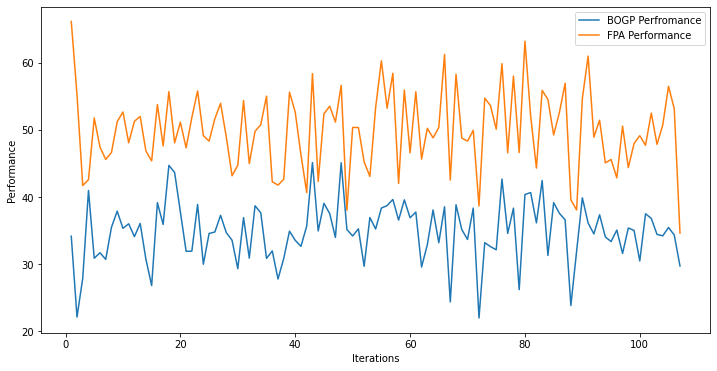

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.084937, actual=29.019
106


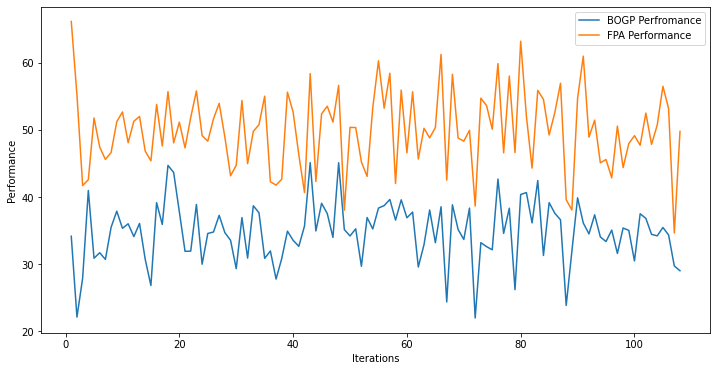

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.024584, actual=33.578
107


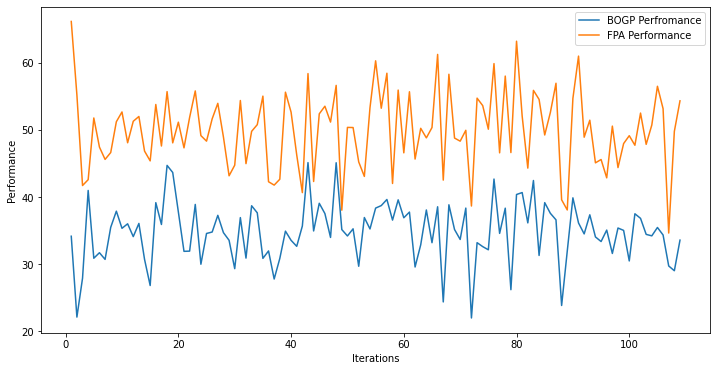

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.010938, actual=32.812
108


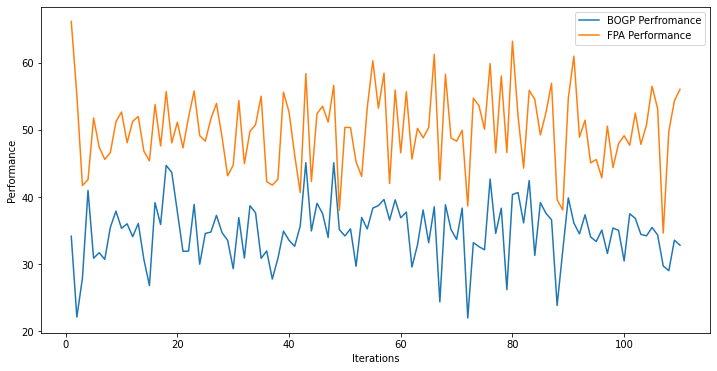

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=34.990060, actual=37.269
109


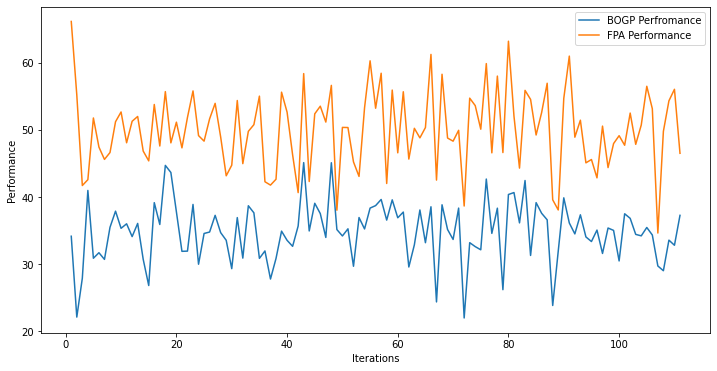

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.012273, actual=41.543
110


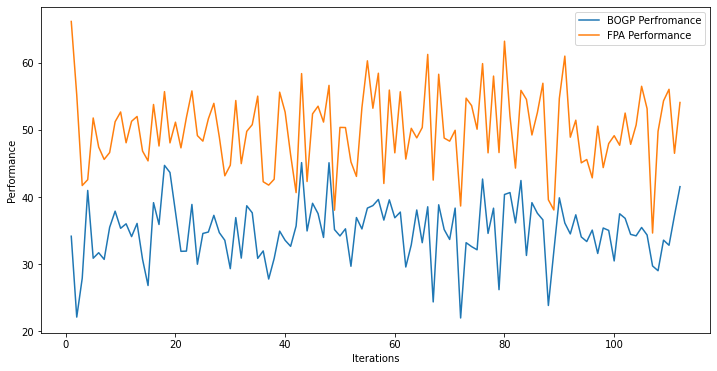

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.073585, actual=33.282
111


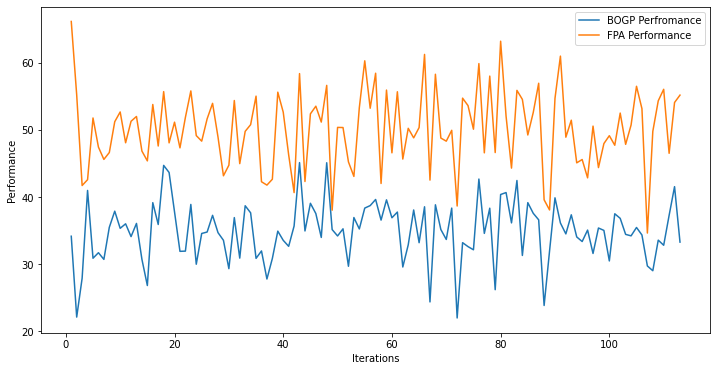

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.057159, actual=35.381
112


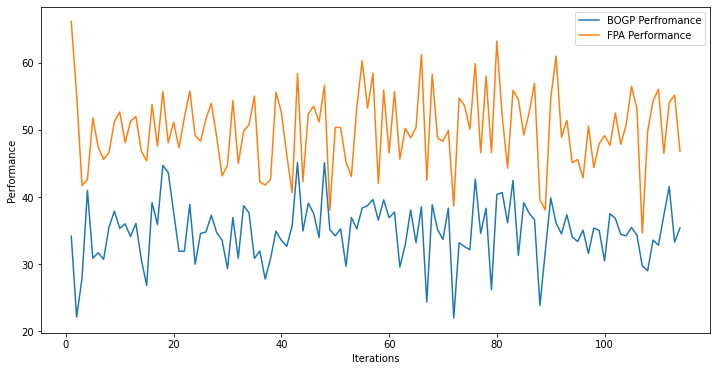

x_next is [  4.18021204  25.27803097 -22.31659119  -2.10612626   1.77535358
   6.52707238 -22.41014642  12.51636324  19.17289558 -10.38527969
  -2.30815321  -9.8626232    5.22729508  29.21199405  20.0057948
  10.90266193  26.62764254 -22.26401489 -16.95249917 -18.35836646]
f()=34.853733, actual=18.246
113


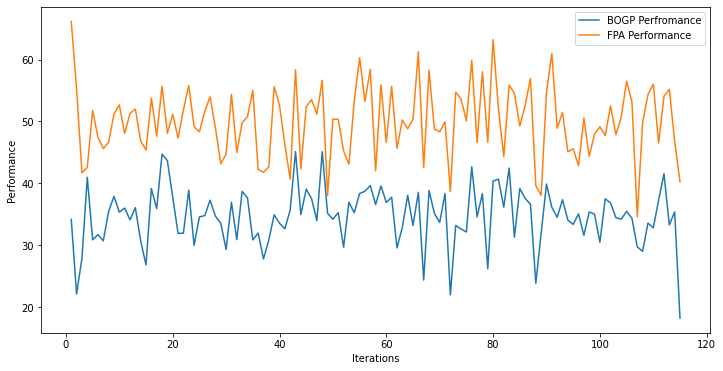

x_next is [-31.         -31.          30.          30.         -31.
  -7.62138204  30.         -31.         -31.          30.
 -31.          30.         -28.82537743  30.         -31.
 -31.          -6.15400952  30.          30.          30.        ]
f()=36.642475, actual=30.908
114


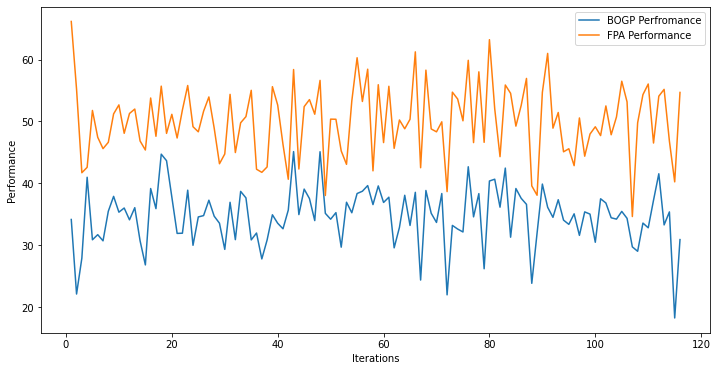

x_next is [-31.           4.17366864  30.          30.         -31.
 -31.          30.         -31.         -31.          30.
 -31.         -31.         -31.          18.14333823 -31.
  30.          30.          30.          30.          30.        ]
f()=35.061599, actual=32.275
115


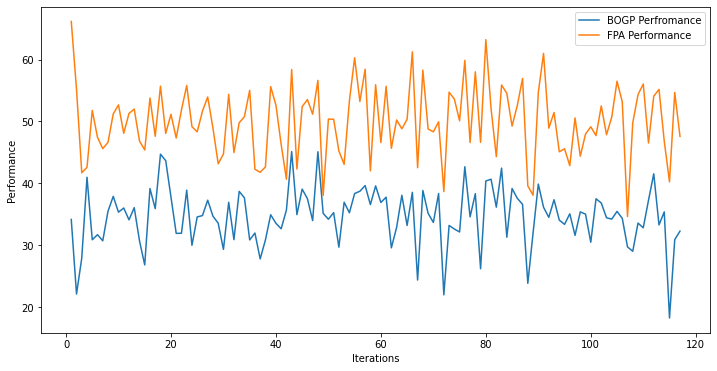

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.029478, actual=35.025
116


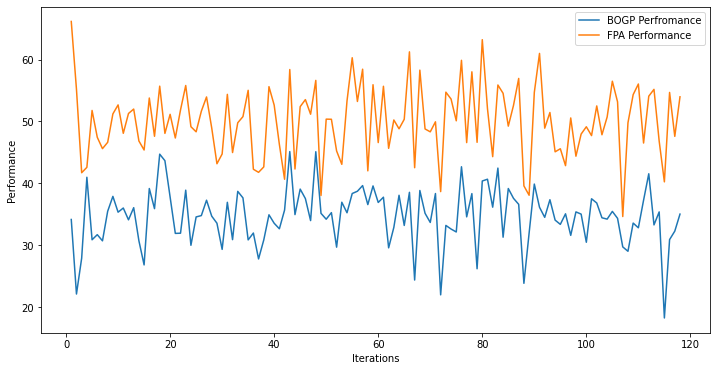

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.029995, actual=31.911
117


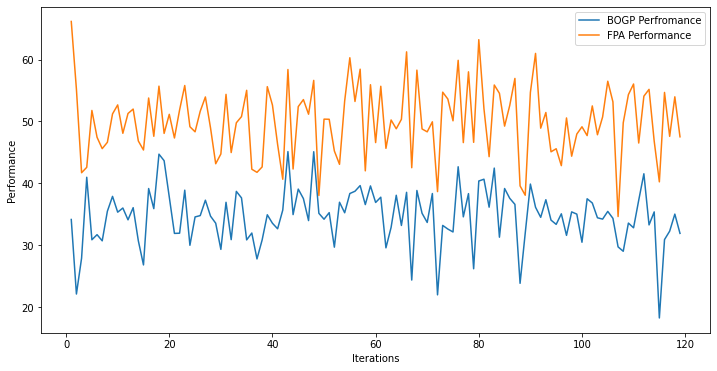

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.002059, actual=35.150
118


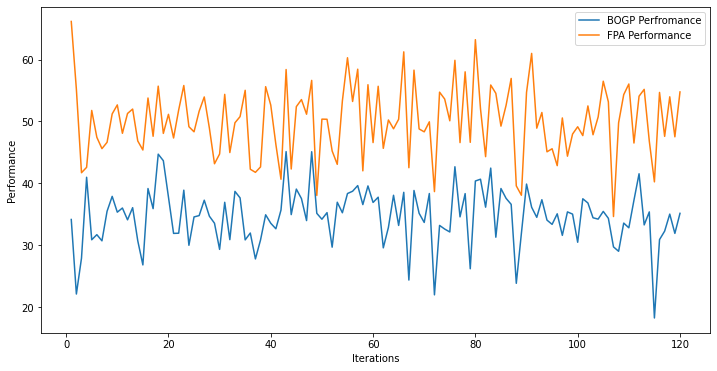

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.003926, actual=39.641
119


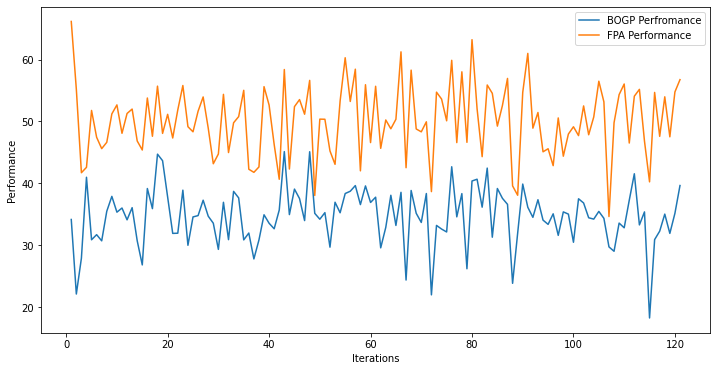

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.045029, actual=32.082
120


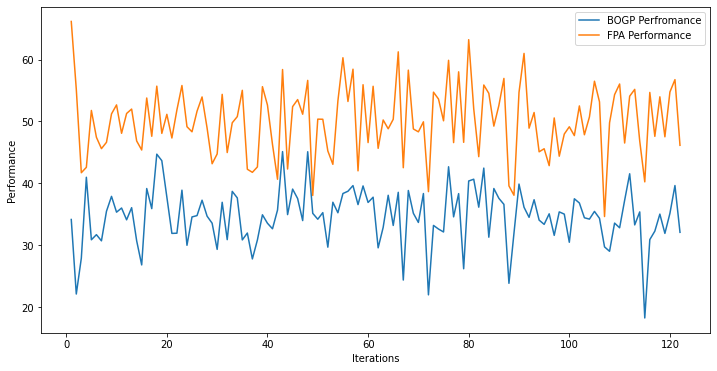

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.019216, actual=41.662
121


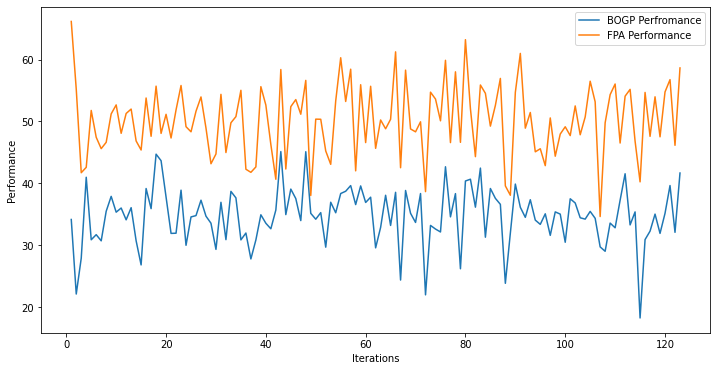

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.076488, actual=42.450
122


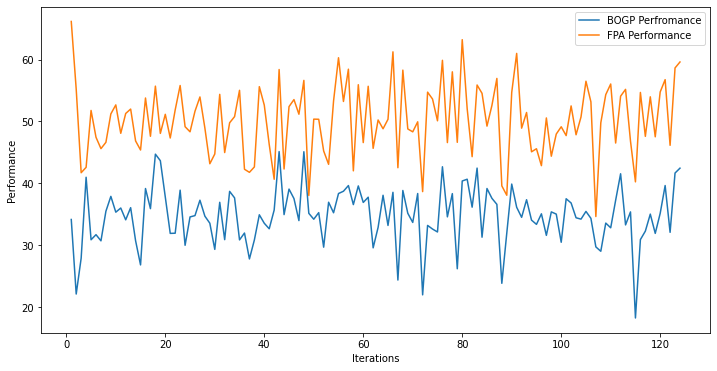

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.139328, actual=42.980
123


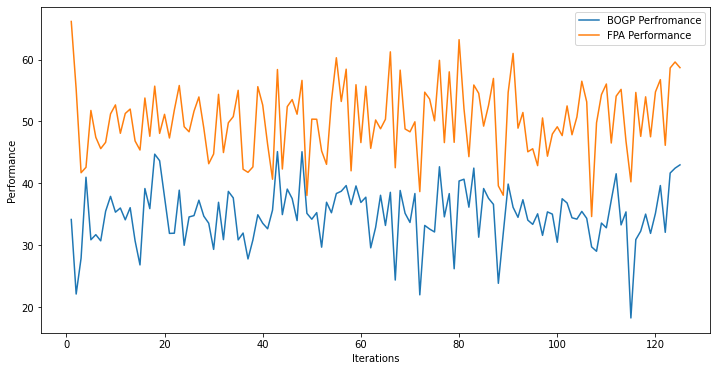

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.205482, actual=33.182
124


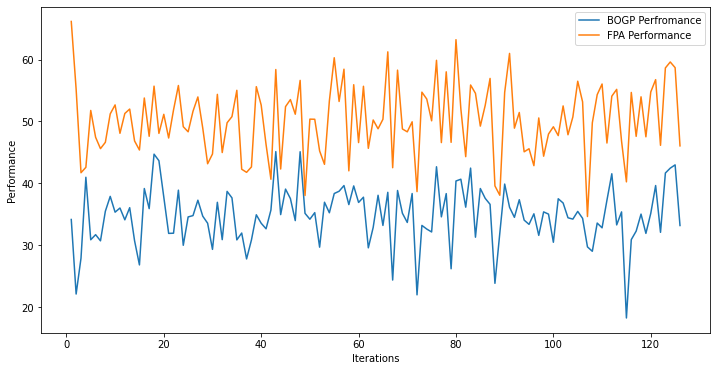

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.188663, actual=38.256
125


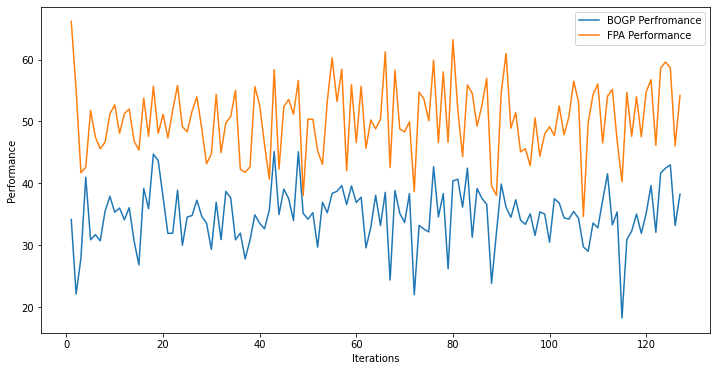

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.214796, actual=38.132
126


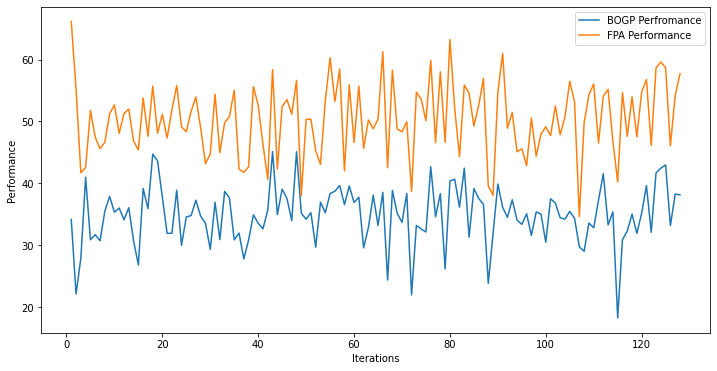

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.239485, actual=45.516
127


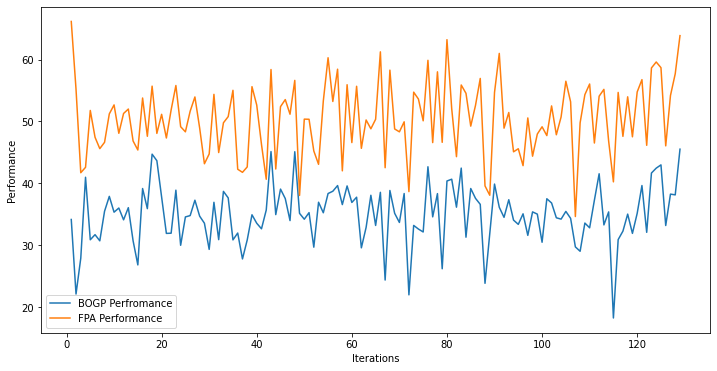

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.322610, actual=28.942
128


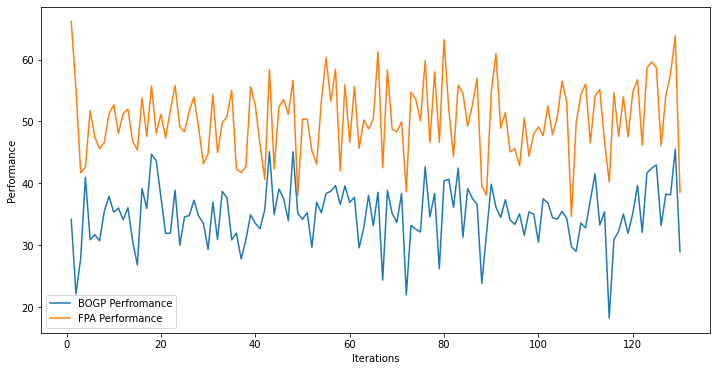

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.269601, actual=37.891
129


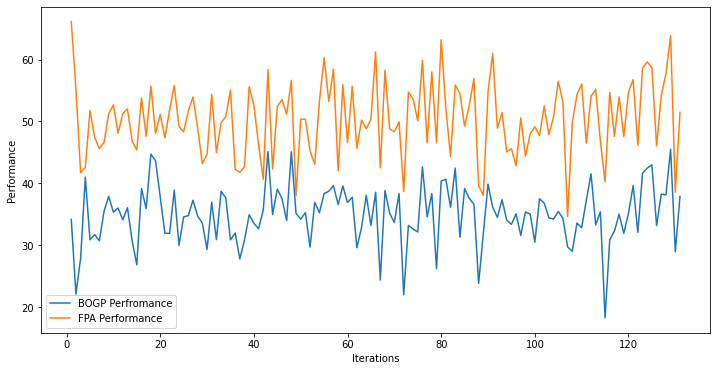

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.291302, actual=36.076
130


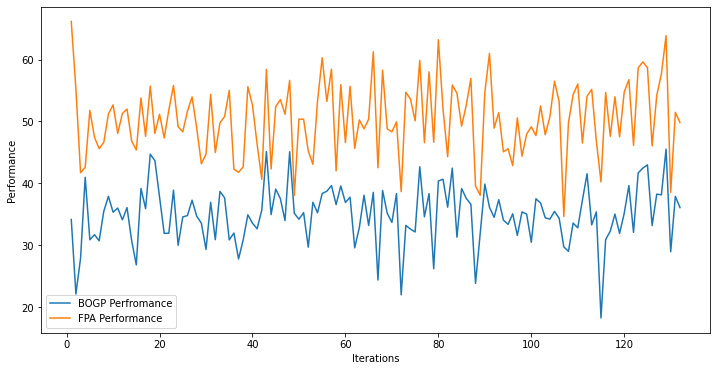

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.298105, actual=30.975
131


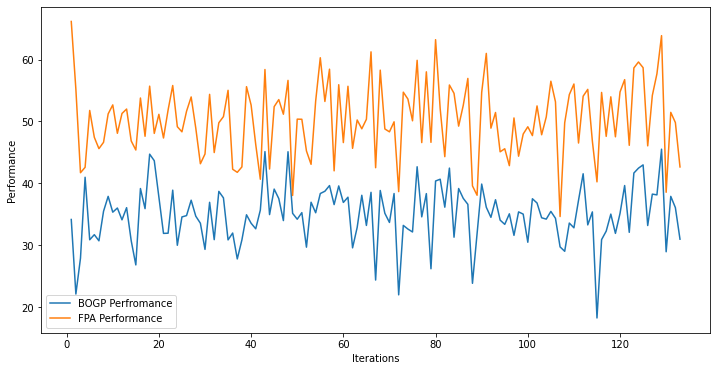

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.263400, actual=30.649
132


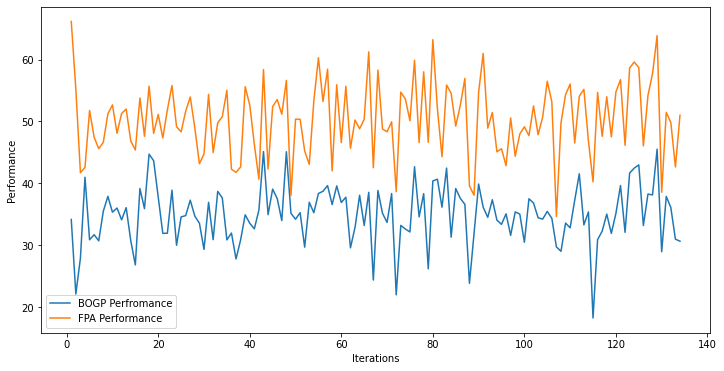

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.226605, actual=36.962
133


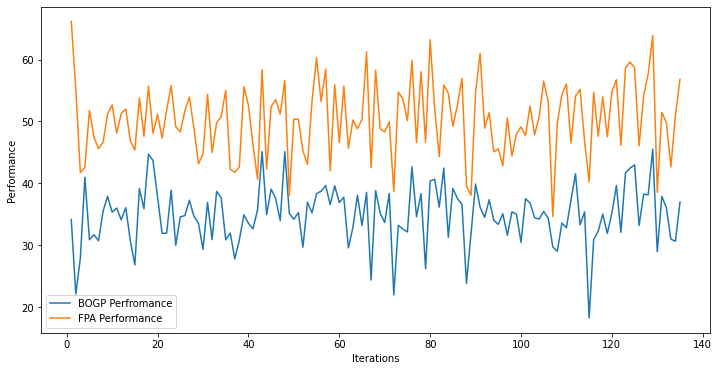

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.240684, actual=35.460
134


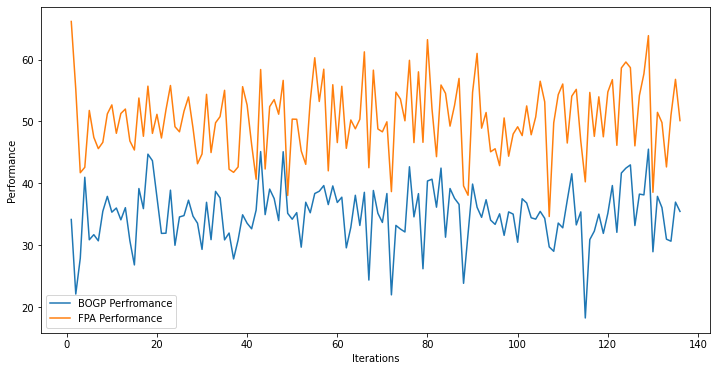

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.242830, actual=29.119
135


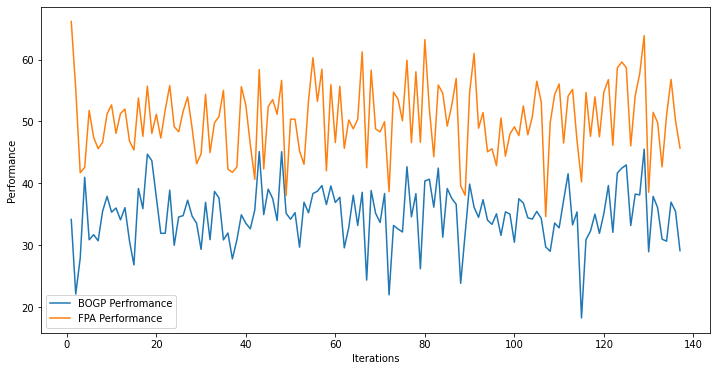

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.194792, actual=35.509
136


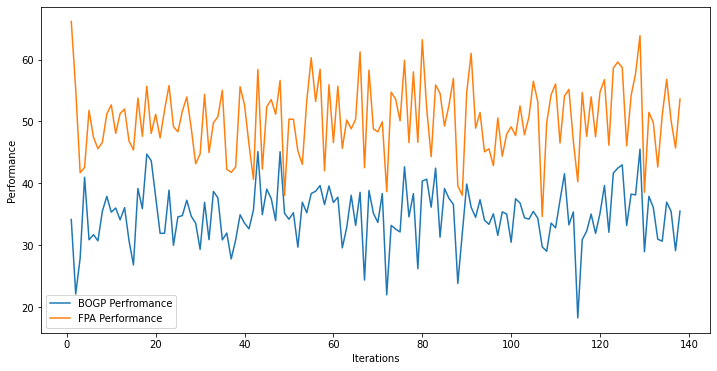

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.197601, actual=46.243
137


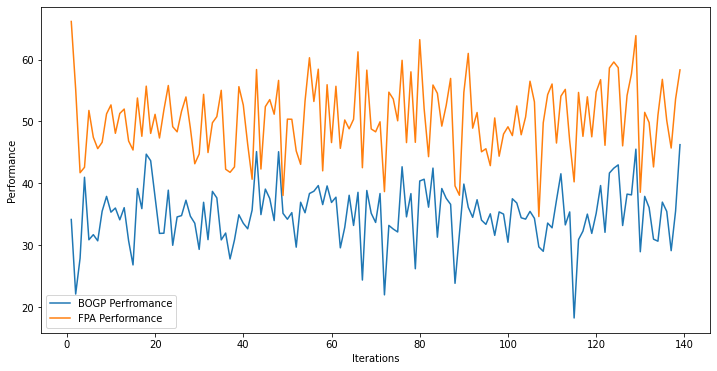

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.280117, actual=31.035
138


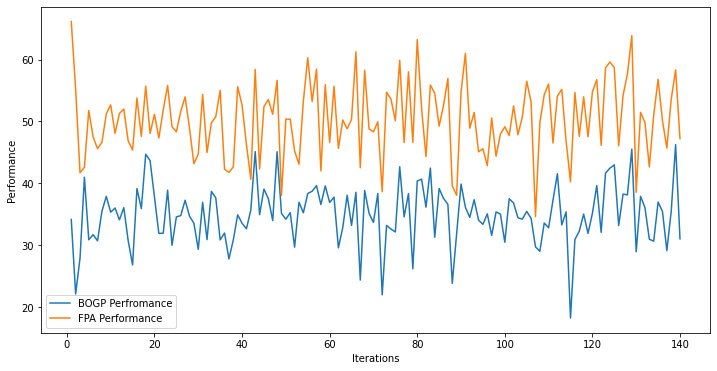

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.247892, actual=30.635
139


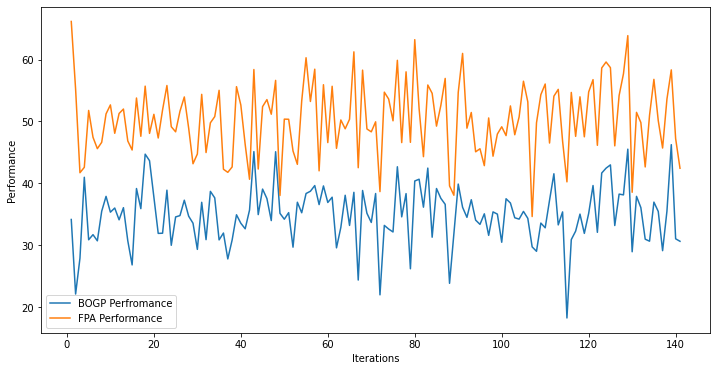

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.213075, actual=34.834
140


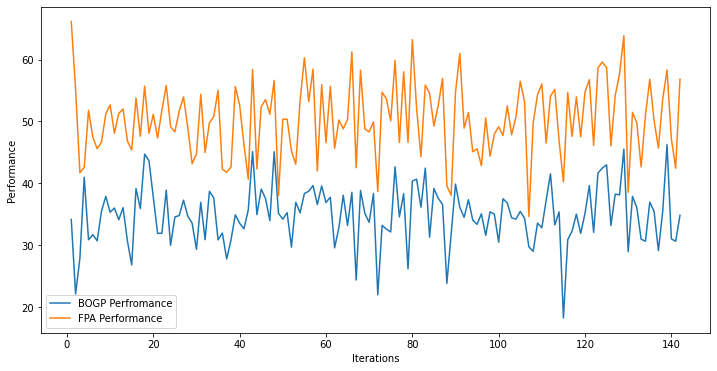

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.210621, actual=30.667
141


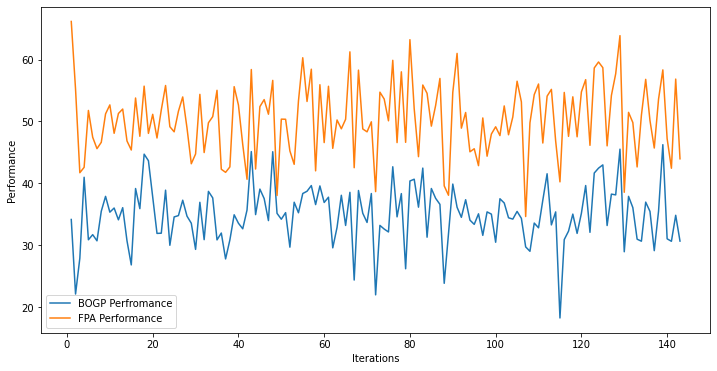

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.176853, actual=33.031
142


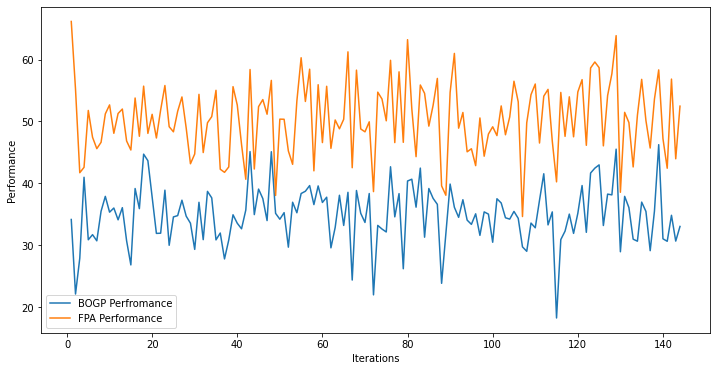

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.161312, actual=35.789
143


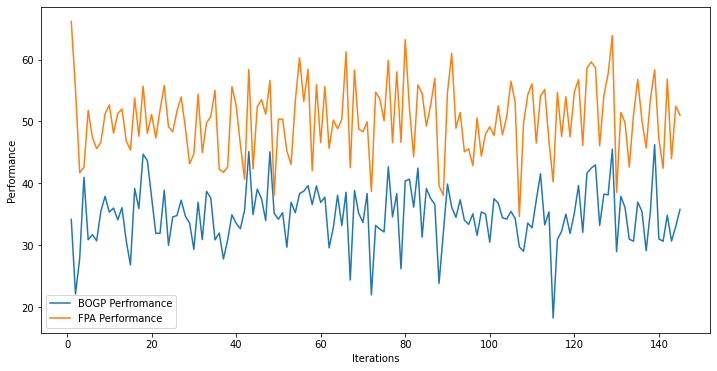

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.166266, actual=26.523
144


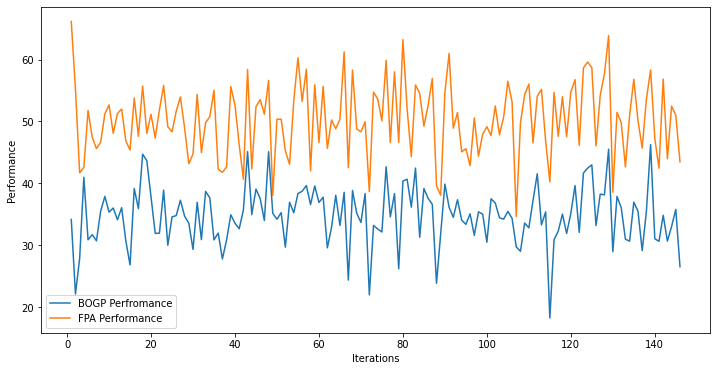

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.102481, actual=34.913
145


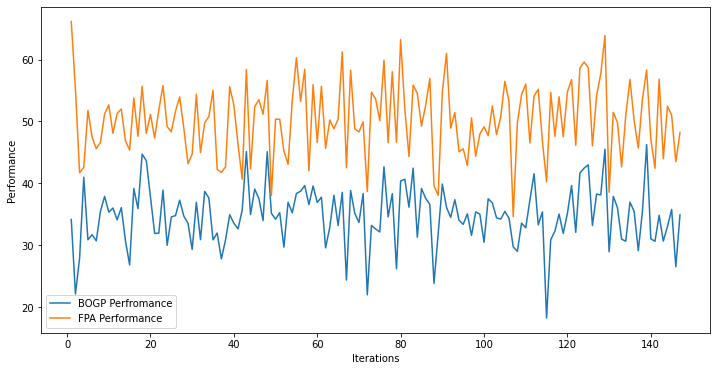

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.101460, actual=37.480
146


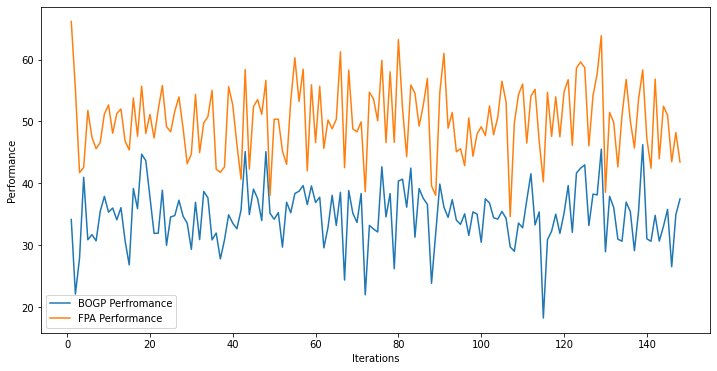

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.118741, actual=33.841
147


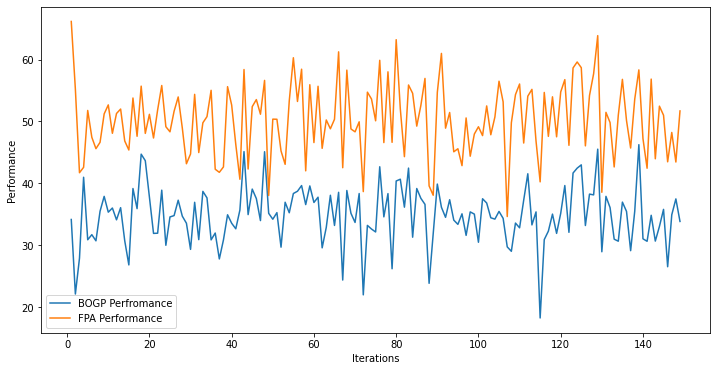

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.109966, actual=40.701
148


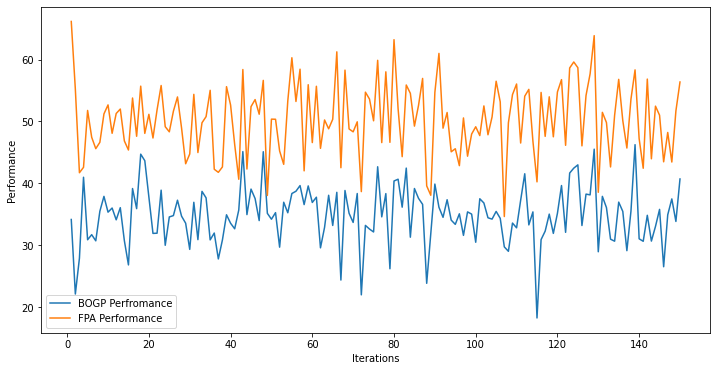

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.149247, actual=39.435
149


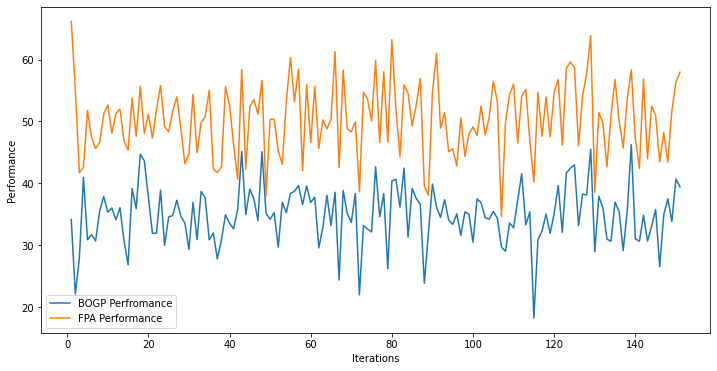

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.179322, actual=32.903
150


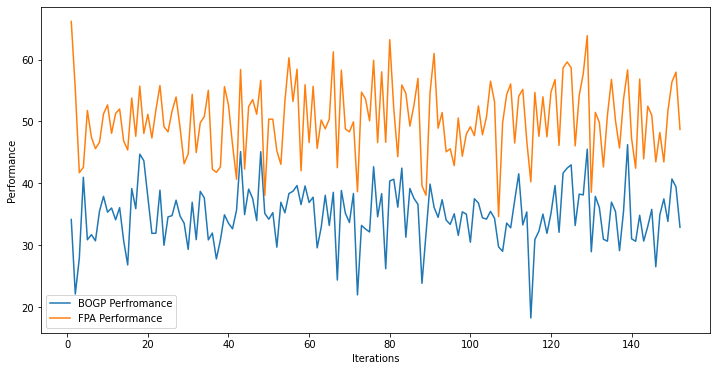

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.163715, actual=39.234
151


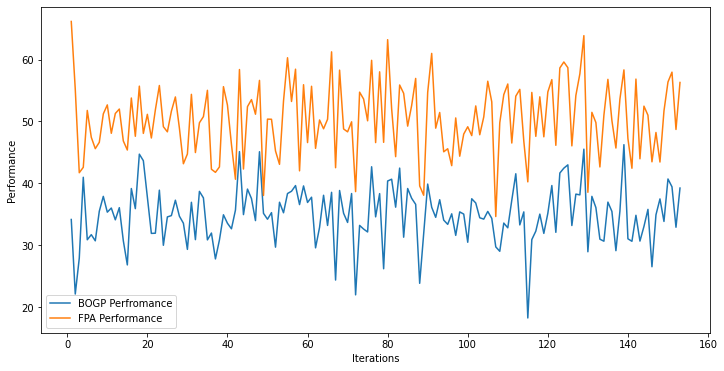

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.191917, actual=38.480
152


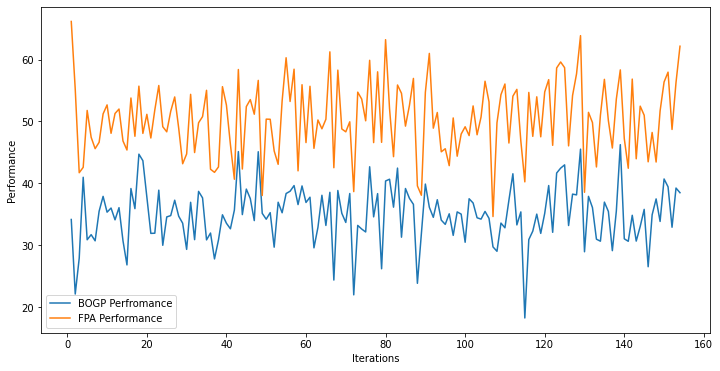

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.214650, actual=29.029
153


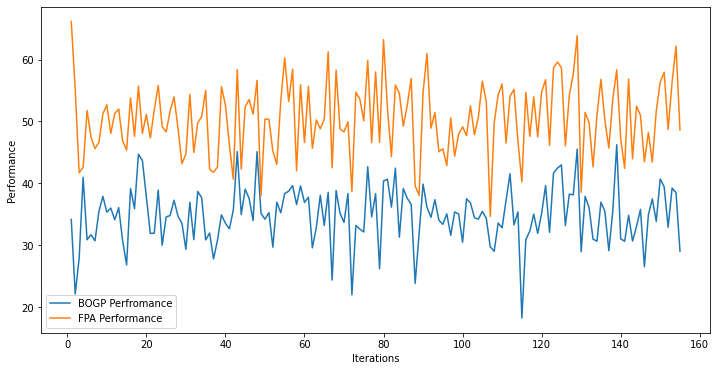

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.172149, actual=34.512
154


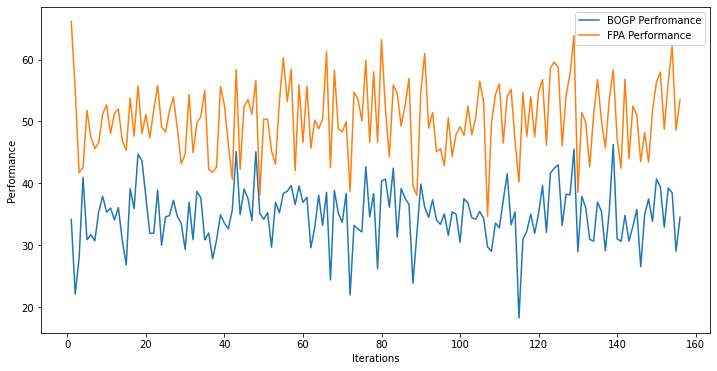

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.167981, actual=36.124
155


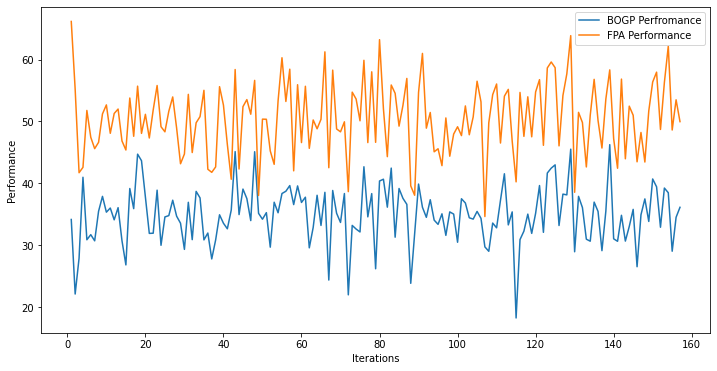

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.174712, actual=36.074
156


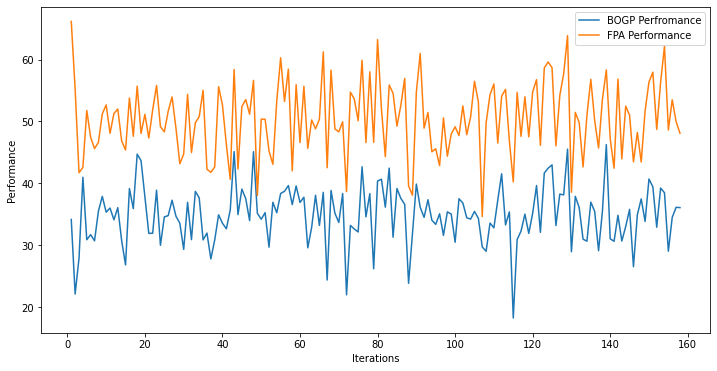

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.181019, actual=32.616
157


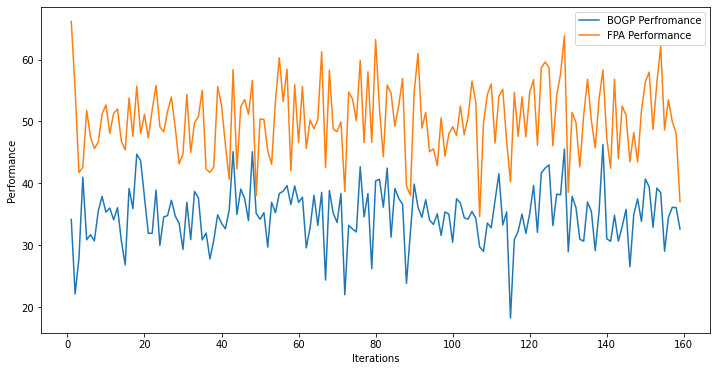

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.164183, actual=39.343
158


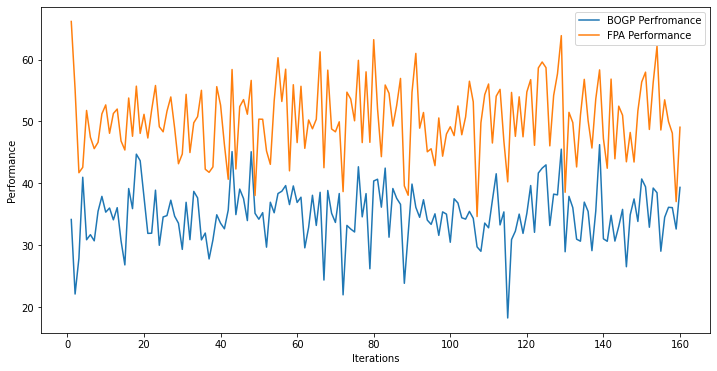

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.191787, actual=37.464
159


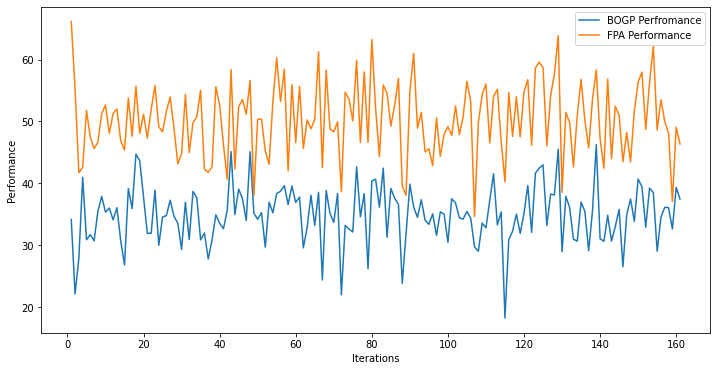

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.206899, actual=33.607
160


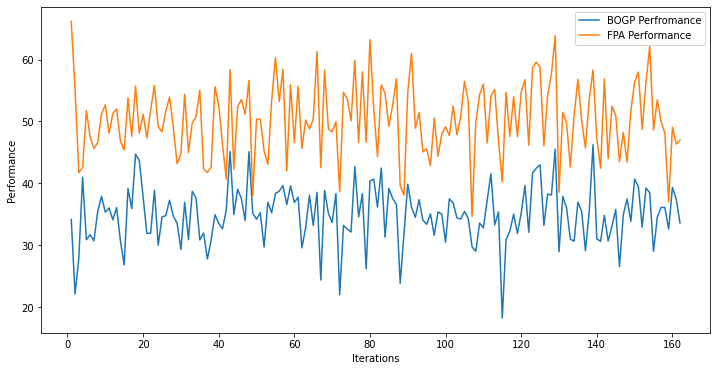

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.196736, actual=35.049
161


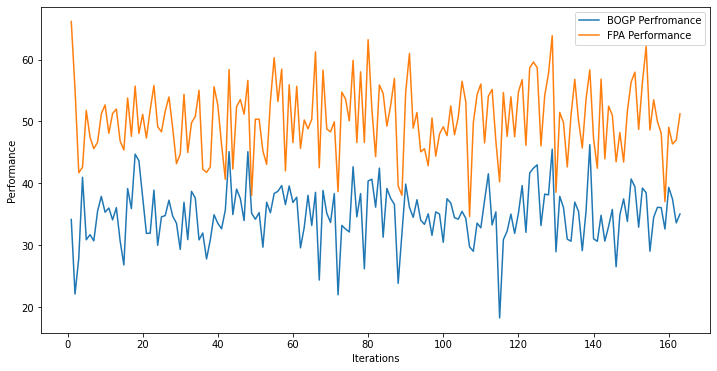

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.196070, actual=37.662
162


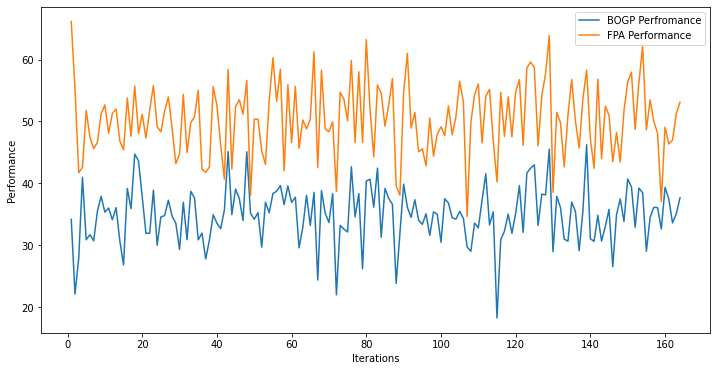

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.212125, actual=36.498
163


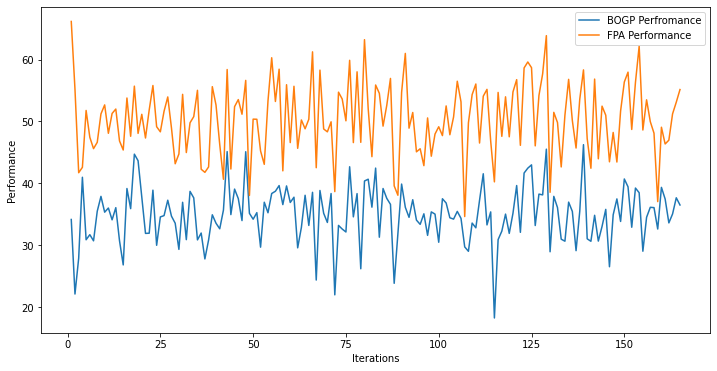

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.220608, actual=37.968
164


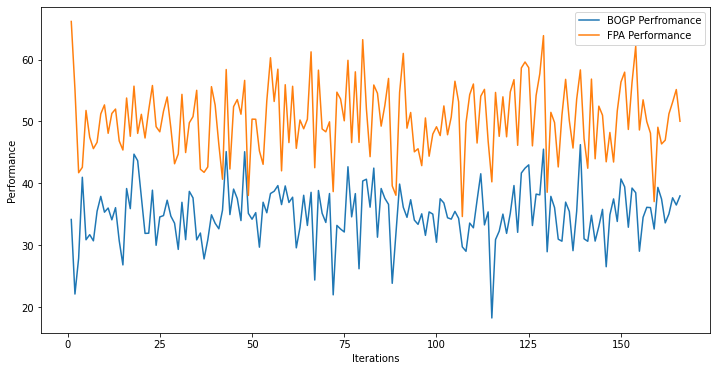

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.238224, actual=37.098
165


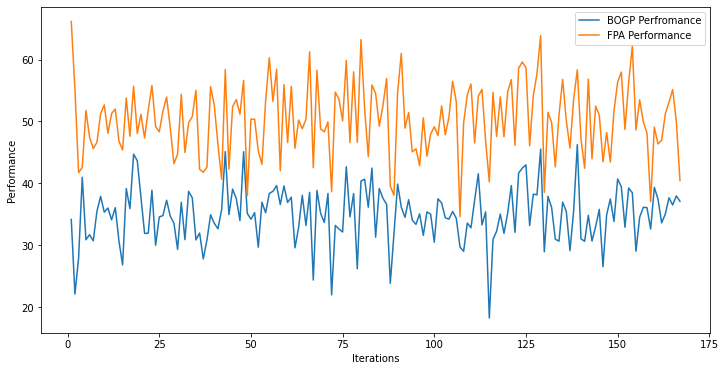

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.250199, actual=42.152
166


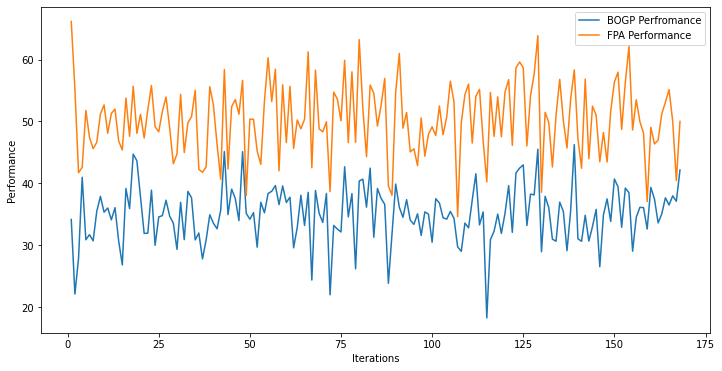

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.293044, actual=48.690
167


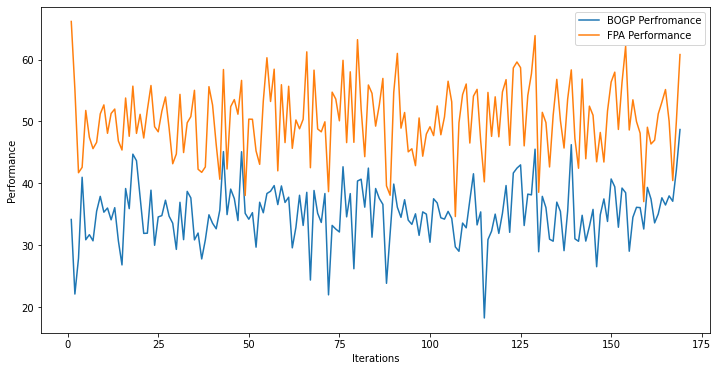

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.374196, actual=40.425
168


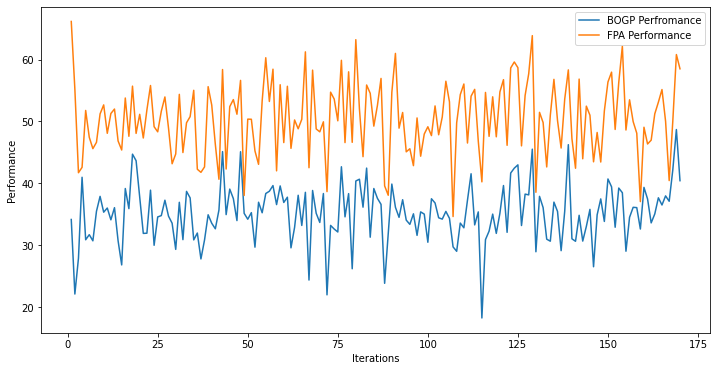

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.405395, actual=41.661
169


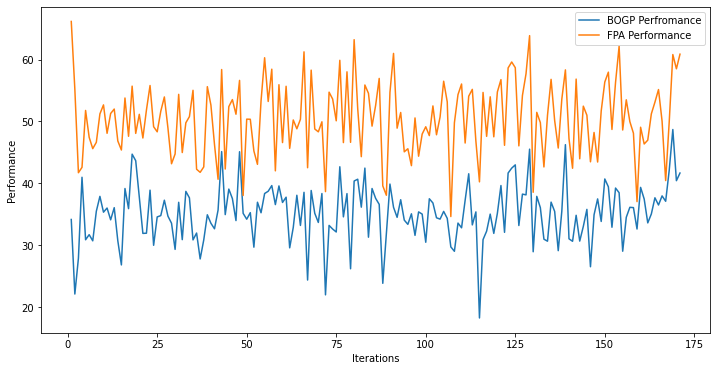

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.443636, actual=34.139
170


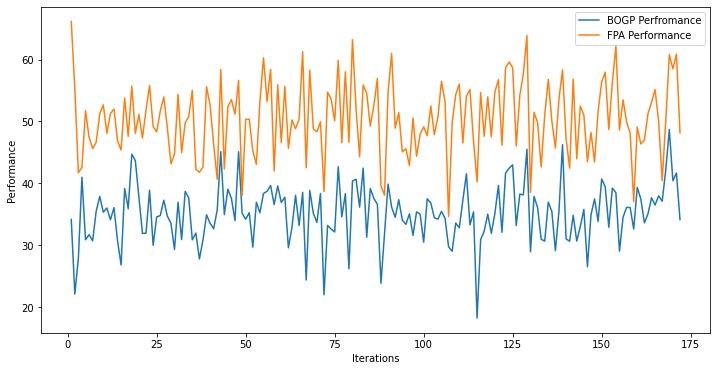

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.435906, actual=35.513
171


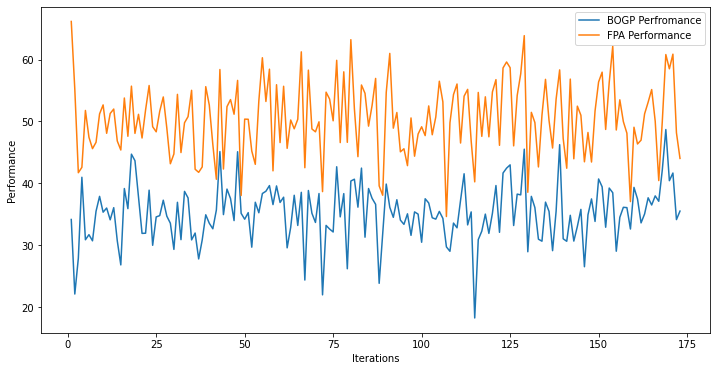

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.436637, actual=37.127
172


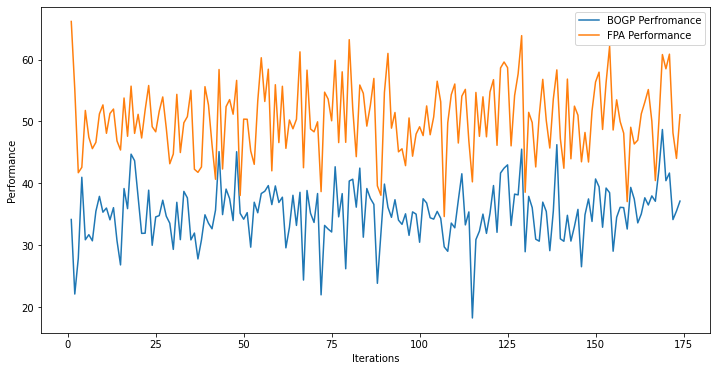

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.447094, actual=29.326
173


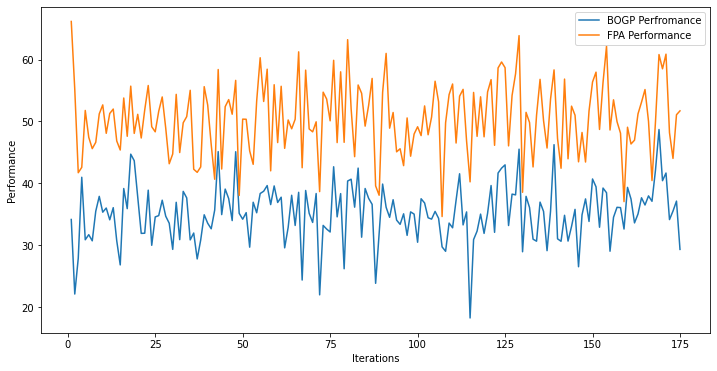

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.410072, actual=41.333
174


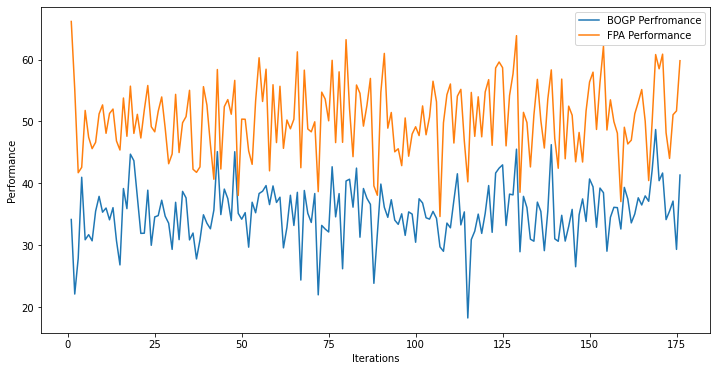

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.445241, actual=42.275
175


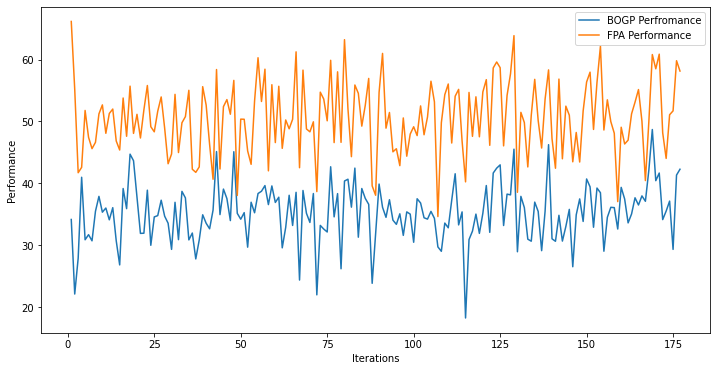

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.485439, actual=43.290
176


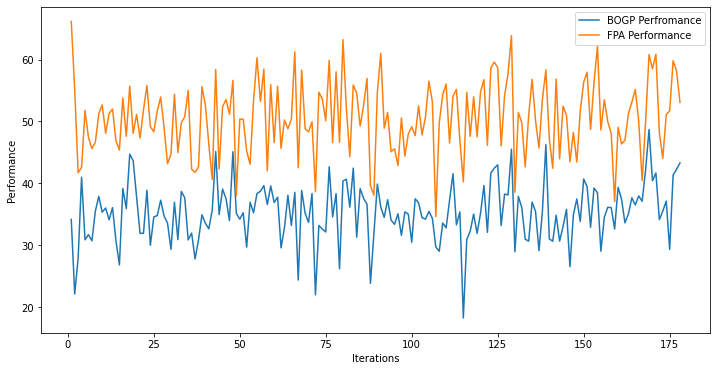

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.530980, actual=33.175
177


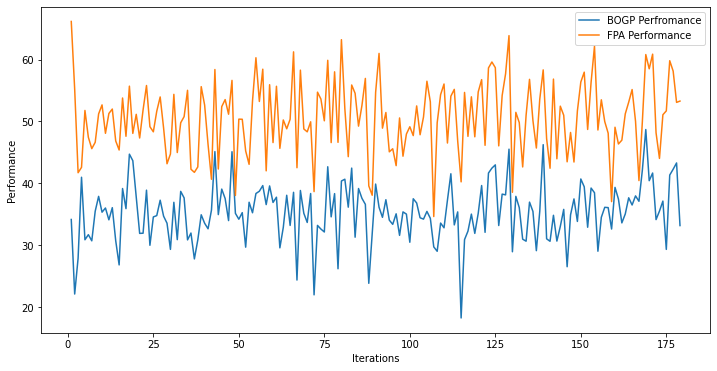

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.517341, actual=37.091
178


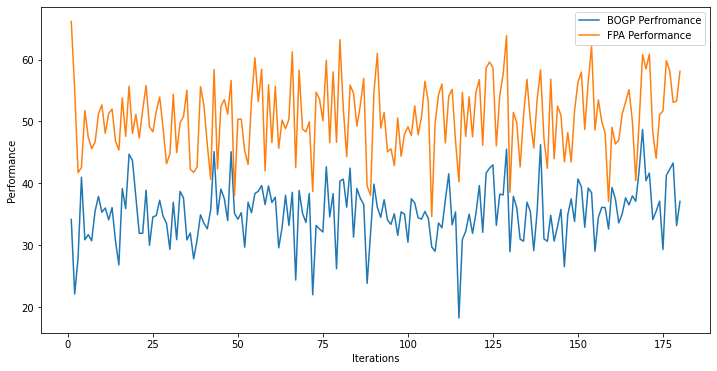

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.526742, actual=34.987
179


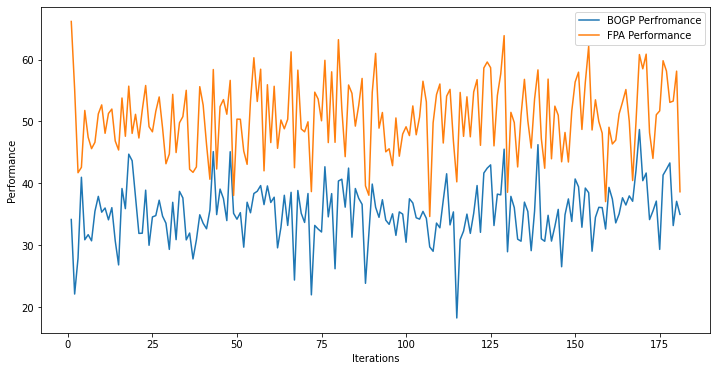

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.523856, actual=32.890
180


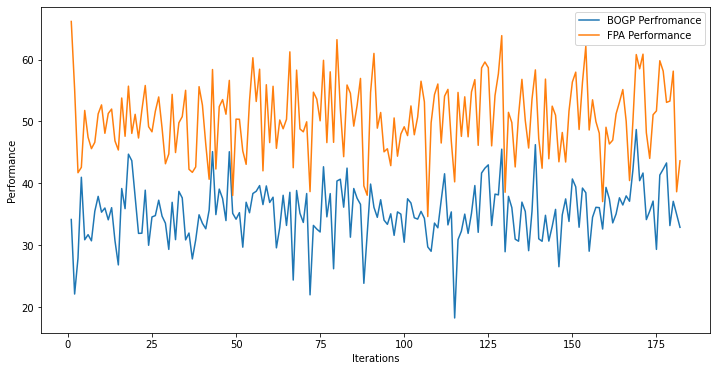

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.508828, actual=32.611
181


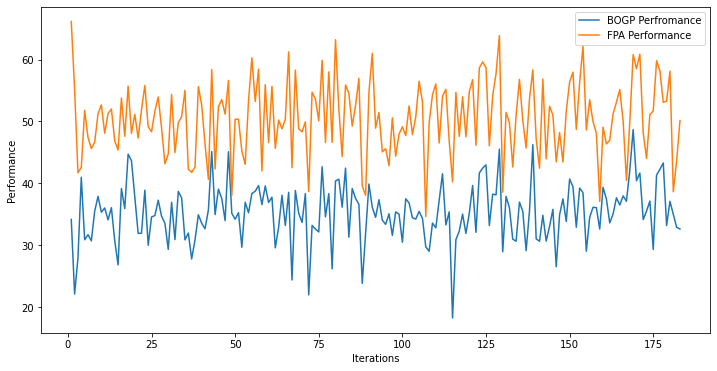

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.492351, actual=40.073
182


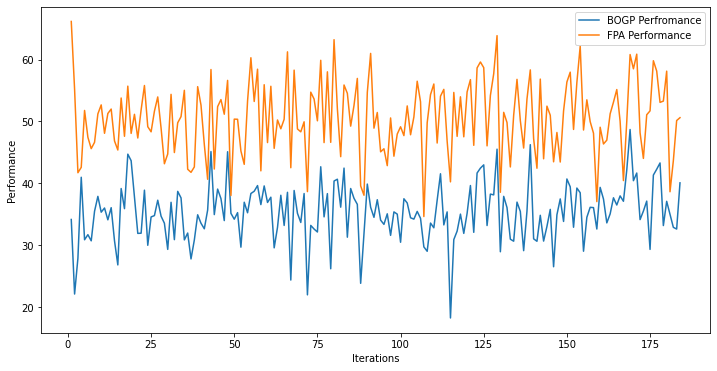

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.518456, actual=40.892
183


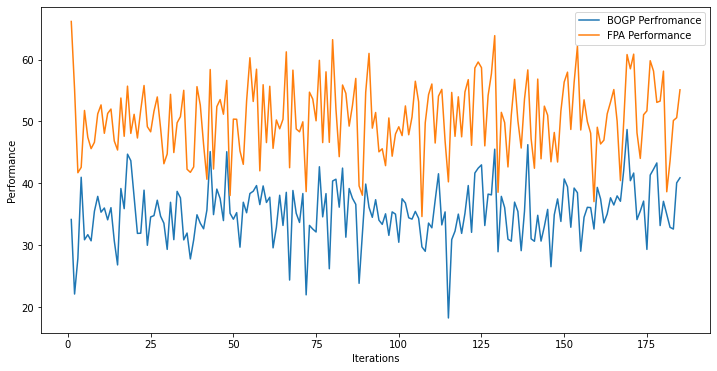

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.548810, actual=39.369
184


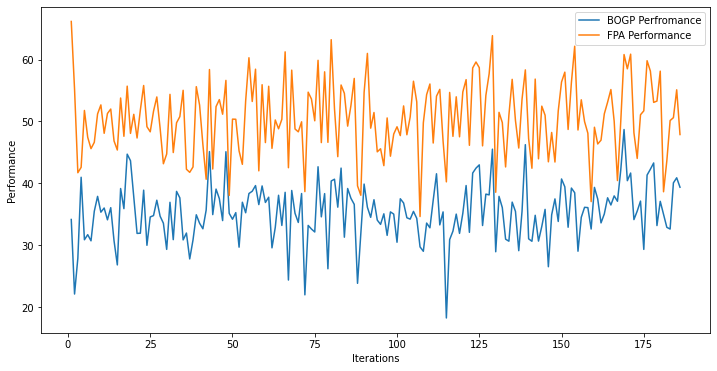

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.570413, actual=40.490
185


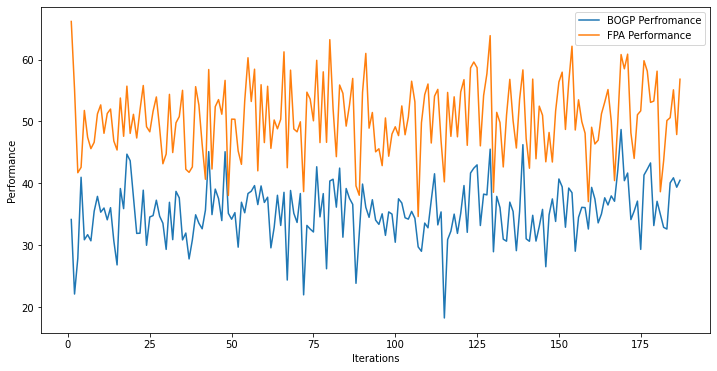

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.597945, actual=34.706
186


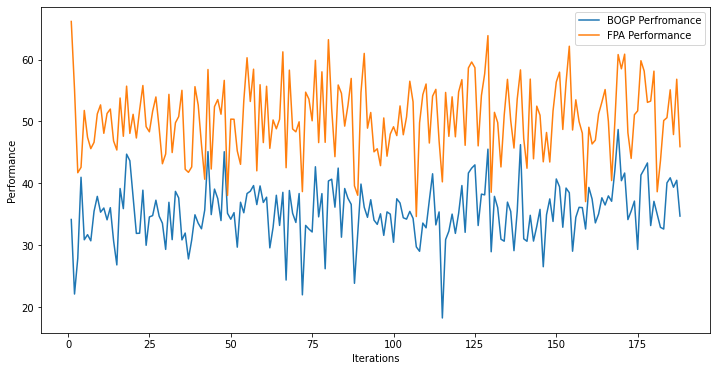

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.593198, actual=30.587
187


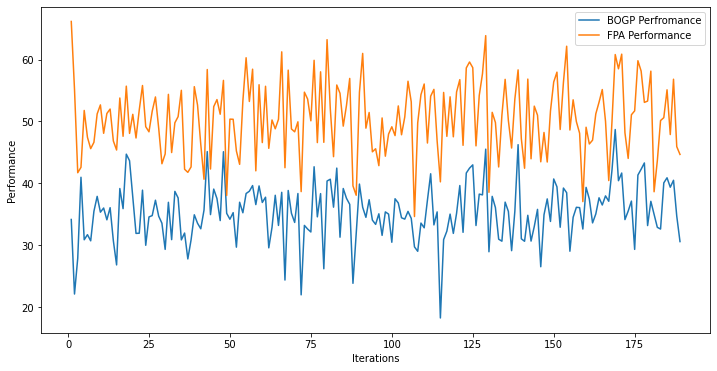

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.565370, actual=32.014
188


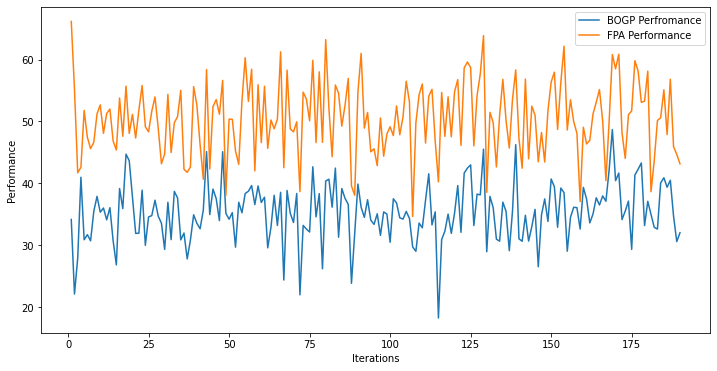

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.545869, actual=36.978
189


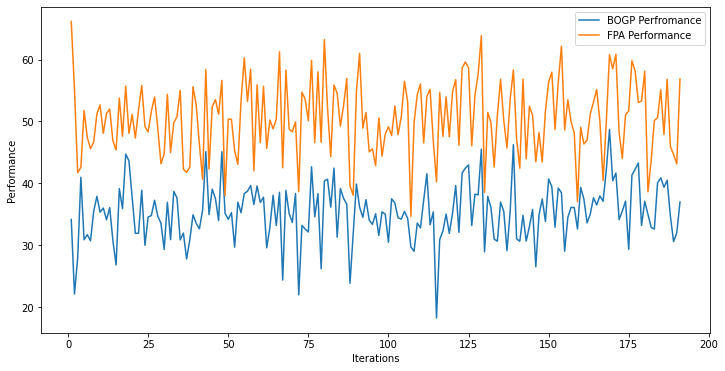

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.553929, actual=32.138
190


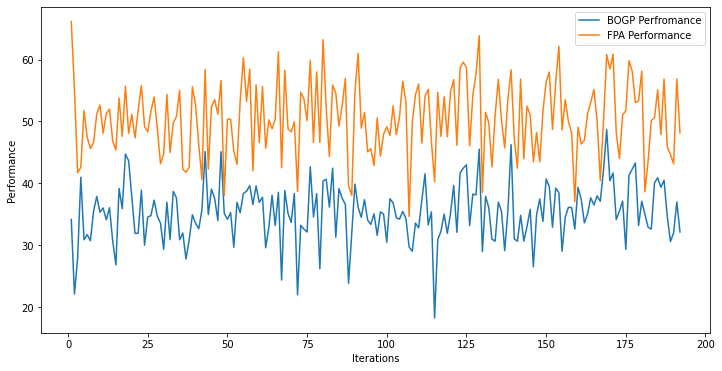

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.535387, actual=35.015
191


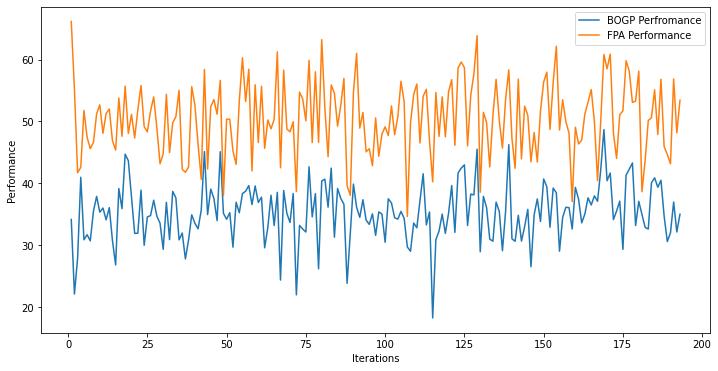

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.532786, actual=32.408
192


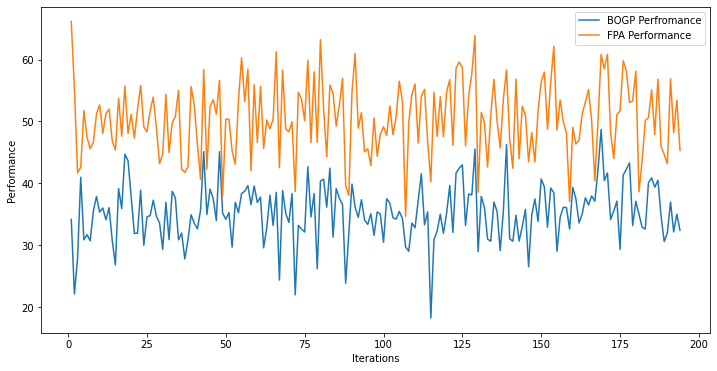

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.516033, actual=38.702
193


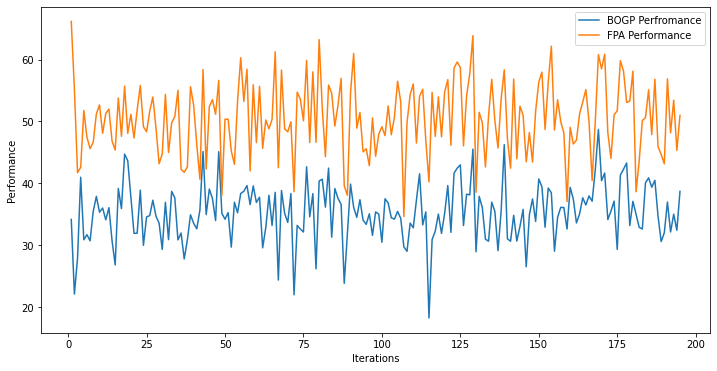

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.533237, actual=37.311
194


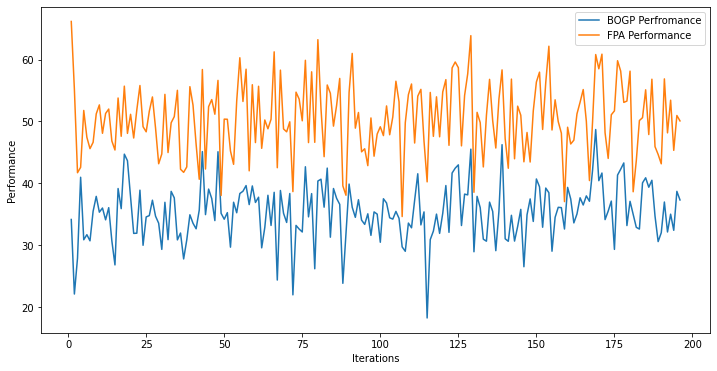

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.542913, actual=26.336
195


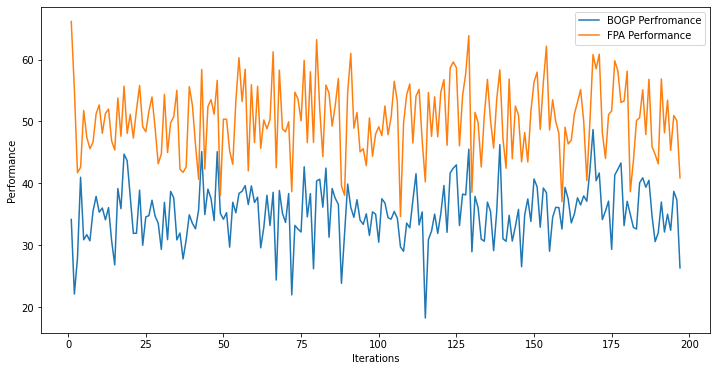

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.493302, actual=32.308
196


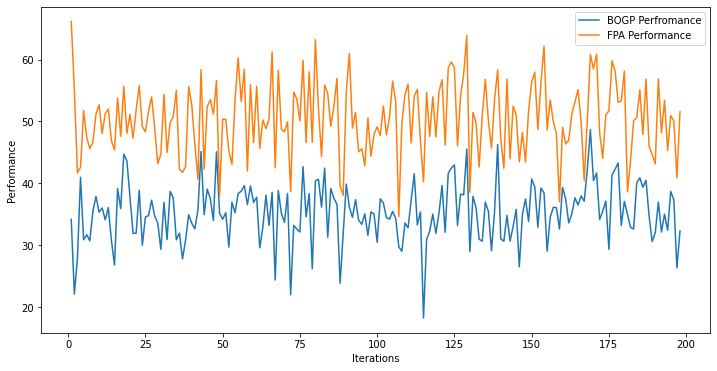

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.476585, actual=42.840
197


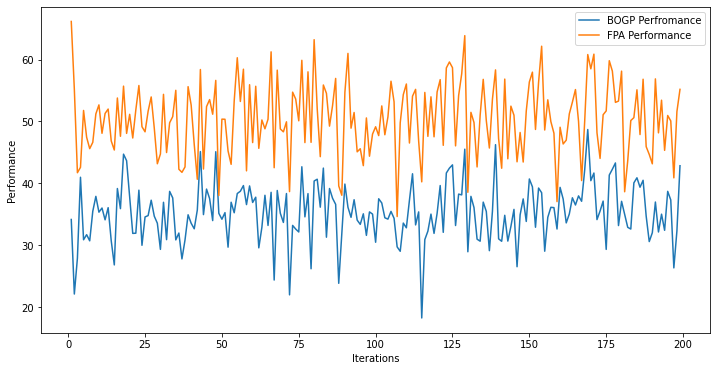

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.514898, actual=34.793
198


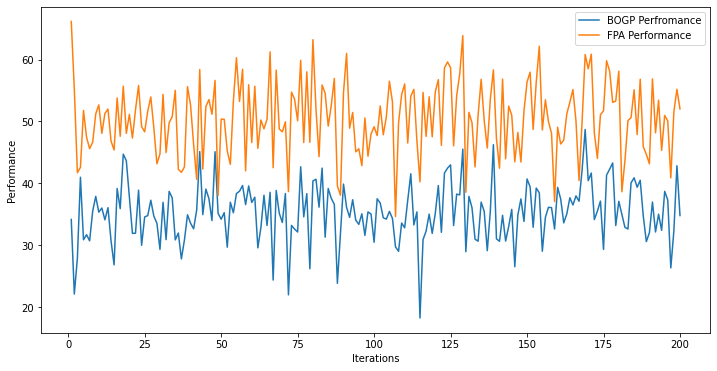

x_next is [-31.  30.  30.  30. -31. -31.  30. -31. -31.  30. -31. -31. -31.  30.
 -31.  30.  30.  30.  30.  30.]
f()=35.511327, actual=39.433
199


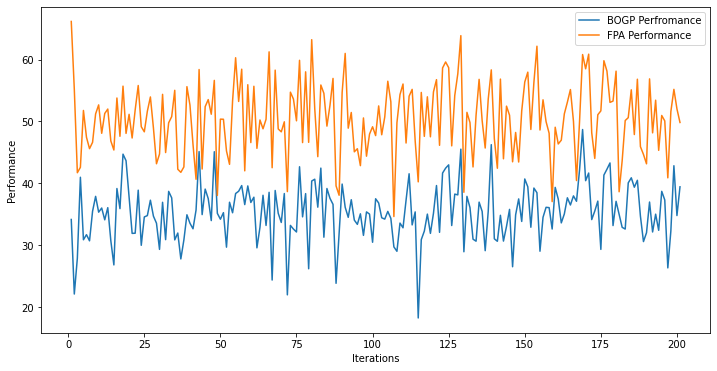

In [ ]:
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel

X = 0 * np.ones([1,var], dtype = "float")
y = np.array([[objective(X[0].reshape((int)(var/number_of_cells), number_of_cells))]])

tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
y_FPA = np.array([[tr_FPA]])

kernels =  ConstantKernel(constant_value=200, constant_value_bounds = (1e-20, 1e20)) * Matern(length_scale=1, length_scale_bounds=(1e-20,1e20), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-20, 1e20)) 
model = GaussianProcessRegressor(kernel = kernels, n_restarts_optimizer=30)

model.fit(X, y)

for i in range(200):
  x_next = opt_acquisition(X, y, model, X.shape[0]+1)

  np.save("/content/drive/MyDrive/trainingx_BOGP_noisy_3.npy",X)
  np.save("/content/drive/MyDrive/trainingy_BOGP_noisy_3.npy",y)
  np.save("/content/drive/MyDrive/grad_trainingyFPA_BOGP_noisy_3.npy",y_FPA)
  
  tr = 0
  for l in range(1):
    tr = tr + objective(x_next.reshape((int)(var/number_of_cells), number_of_cells))
  tr = tr/1.0  
  actual = tr

  tr_FPA = objective_FPA(P_max * np.ones([1,var], dtype = "float").reshape((int)(var/number_of_cells), number_of_cells))
  
  est, _ = surrogate(model, [x_next])
  print("x_next is", x_next)
  print('f()=%3f, actual=%.3f' % (est, actual))
  
  X = vstack((X, [x_next]))
  y = vstack((y, [[actual]]))
  y_FPA = vstack((y_FPA, [[tr_FPA]]))
  
  model.fit(X, y)
  
  print(i)
  pyplot.figure(figsize = (12, 6))

  pyplot.xlabel("Iterations")
  pyplot.ylabel("Performance")
  pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
  pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
  pyplot.legend(["BOGP Perfromance","FPA Performance"])
  pyplot.show()


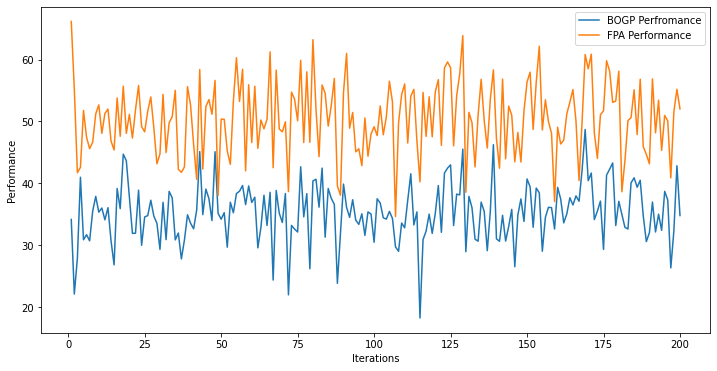

In [13]:
pyplot.figure(figsize = (12, 6))   
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1),y[:])
pyplot.plot(np.arange(1,X.shape[0]+1), y_FPA[:])
pyplot.legend(["BOGP Perfromance","FPA Performance"])
pyplot.show() 

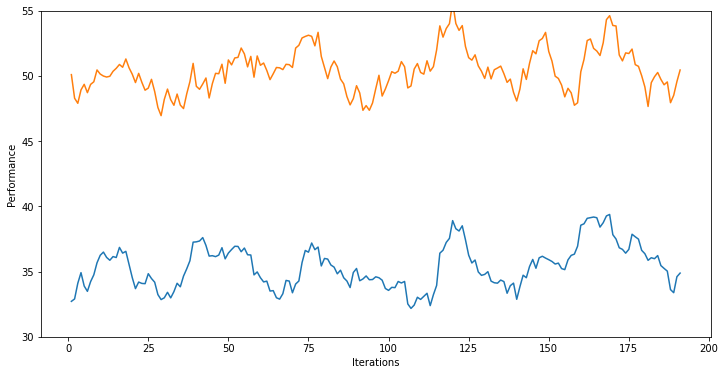

In [14]:
MA = 10
pyplot.figure(figsize = (12, 6))
pyplot.xlabel("Iterations")
pyplot.ylabel("Performance")
pyplot.plot(np.arange(1,X.shape[0]+1-MA+1), np.convolve(y[:,0], np.ones(MA)/MA, mode='valid'))
pyplot.plot(np.arange(1,X.shape[0]+1-MA+1), np.convolve(y_FPA[:,0], np.ones(MA)/MA, mode='valid'))
pyplot.ylim([30,55])
pyplot.show()